## Task 1 : Data Exploration
### Explore the (provided) data set using descriptive statistics (e.g. mean values, standard deviations, min/max values, missing values) and visualizations (e.g. histograms, boxplots)
Point out which data quality issues you identified in terms of
– Missing values
– Noise
– Outliers
– Features to be transformed, standardized or normalized

Point out which data reduction actions would make sense from your perspective in terms of
– Feature selection
– Instance selection

## Table of Contents

1. [Import and Data Loading](#import-and-data-loading),
2. [Dataframes](#dataframes),
    2.1 [Summary of needed Dataframes for the Data Exploration](#summary-of-needed-dataframes-for-the-data-exploration)
3. [Data Overview](#data-overview),
    3.1 [Identifying Variables](#identifying-variables),
        3.1.1 [Types of Information](#types-of-information),
4. [Missing Values](#missing-values),
    4.1 [Conclusion Missing Values](#conclusion-missing-values),
5. [Noise Handling](#noise-handling),
    5.1 [Encoding wine-type](#endocing-wine_type),
    5.2 [Separating Group of Wines](#separating-group-of-wines),
        5.2.1 [Gamay Wines](#gamay-wines),
        5.2.2 [Non Gamay Wines](#non-gamay-wines),
    5.3 [Joint Visualization of Predictions](#joint-visualization-of-predictions),
    5.4 [Determining Noise](#determining-noise)
6. [Outlier Handling](#outlier-handling),
    6.1 [Outliers without Gamay](#outliers-without-gamay),
    6.2 [Functions Univariate Analysis](#functions-univariate-analysis),
    6.3 [Univariate Analysis (without Gamay)](#univariate-analysis-(without-gamay)),
    6.4 [Multivariate Analysis (without Gamay)](#multivariate-analysis-(without-gamay)),
    6.5 [Outlier Conclusion (without Gamay)](#outlier-conclusion-(without-gamay)),
    6.6 [Univariate Analysis (with Gamay)](#univariate-analysis-(with-gamay)),
    6.7 [Multivariate Analysis (with Gamay)](#multivariate-analysis-(with-gamay)),
    6.8 [Outlier Conclusion (with Gamay)](#outlier-conclusion-(with-gamay)),
7. [Scatterplot Functions](#scatterplot-functions)
    7.1 [Scatterplot showing outliers without Gamay](#scatterplot-showing-outliers-without-gamay),
    7.2 [Scatterplot showing outliers with Gamay](#scatterplot-showing-outliers-with-gamay),
8. [Features to be transformed, standardized or normalized](#features-to-be-transformed-standardized-or-normalized),
9. [Feature Selection](#feature-selection),
10. [Instance Selection](#instance-selection)



## Import and Data Loading
We import the future packages which we are going to use as well as load the data
After we were able to load the data for the first time - we realized, that the column names have used blank spaces. For the ease of use, we decided to replace them by underscores

In [1]:
# Importing
# Basic
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import missingno as msno

from collections import Counter

# Scipy
from scipy import stats
from scipy.stats import shapiro

# SciKitLearn
from sklearn import datasets
from sklearn import svm
from sklearn import preprocessing
from sklearn import metrics

from sklearn.cluster import DBSCAN

from sklearn.pipeline import Pipeline

from sklearn.neighbors import LocalOutlierFactor
from sklearn.neighbors import KNeighborsClassifier

from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import MinMaxScaler

from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_predict
from sklearn.model_selection import train_test_split

from sklearn.feature_selection import SelectFromModel, RFECV

from sklearn.linear_model import LinearRegression

from sklearn.ensemble import RandomForestClassifier

from sklearn.metrics import classification_report, accuracy_score, mean_squared_error

from scipy.stats import shapiro

# Read CSV file to load data
df_wine = pd.read_csv('wine_training.csv', sep=';', index_col='Unnamed: 0')

# Changing column names -> space to underscore
df_wine.columns = df_wine.columns.str.replace(' ', '_')

## Dataframes
### Summary of needed Dataframes for the Data Exploration
#### This file has been continuously updated to show all basic Dataframes which we are working with

df_wine : original dataframe provided
df_no_nan : wine dataset without nan values
df_clean_quality : wine dataset no 99 values
df_wine_clean : wine dataset no 99 values, nan values > 40 % per row dropped, nan values < 40 % per row mean transformed
df_wine_clean_ohe : df_wine_clean including one hot encoding for wine_type
<br/>

#### for the following data has been cleaned - meaning no 99 values and nan values (40% clause) have been transformed
df_pinot_noir : wine dataset with wine_type = pinot_noir
df_merlot : wine dataset with wine_type = merlot
df_chardonnay : wine dataset with wine_type = chardonnay
df_sauvignon : wine dataset with wine_type = sauvignon
df_gamay : wine dataset with wine_type = gamay
df_gamay_ohe : gamay dataset incl. one hot encoding

df_wine_red : wine dataset with wine_type = pinot_noir, merlot, cabernet_sauvignon, gamay
df_wine_white : wine dataset with wine_type = chardonnay
df_wine_no_gamay : wine dataset with wine_type != gamay because of quality reasons
df_wine_no_gamay_ohe : df_wine_no_gamay dataset incl. one hot encoding

## Data Overview
Overviewing the data allows us to gain a better understanding of the data we are working with, including its characteriscs, and patterns.

We want to get a rough sketch of the data set, its size, and gain first impressions.
Therefore, we have a look at the first and the last five rows and of a random data sample of 10 rows of the complete data set.

In [2]:
# Data Overview
df_wine.head()

,wine_type,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,magnesium,flavanoids,minerals,calcium,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality
0,Pinot noir,5.8,0.15,0.49,1.1,76.729301,894.94,186.639301,109.91,0.048,21.0,98.0,0.99290,3.19,0.48,9.2,5
1,Merlot,6.6,0.25,0.32,5.6,4.795712,1160.95,251.875712,247.08,0.039,15.0,68.0,0.99163,2.96,0.52,11.1,6
2,Chardonnay,6.7,0.21,0.34,1.5,85.193710,789.82,304.703710,219.51,0.035,45.0,123.0,0.98949,3.24,0.36,12.6,7
3,Merlot,8.3,0.28,0.27,17.5,11.976525,777.86,237.586525,225.61,0.045,48.0,253.0,1.00014,3.02,0.56,9.1,6
4,Merlot,7.5,0.42,0.19,6.9,5.599673,785.72,95.399673,89.80,0.041,62.0,150.0,0.99508,3.23,0.37,10.0,6


Looking at the data set, we learn that it is a classification of wine and its ingredients which is usually performed in wine laboratories. Through the feature "wine_type" the grape variety is defined. At the same time, the quality of the wine is determined by the feature "quality".
source ('https://www.hk-weinlab.de/services/')

In [3]:
# Show the last 5 rows (it shows that the dataset consists of 4000 rows)
df_wine.tail()

,wine_type,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,magnesium,flavanoids,minerals,calcium,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality
3995,Cabernet Sauvignon,6.4,0.23,0.37,7.9,92.701914,1143.32,318.791914,226.09,0.050,60.0,150.0,0.99488,2.86,0.49,9.3,6
3996,Cabernet Sauvignon,7.0,0.22,0.26,9.2,94.807955,863.32,322.107955,227.30,0.027,37.0,122.0,0.99228,3.06,0.34,12.5,8
3997,Merlot,7.5,0.26,0.30,4.6,50.112474,831.67,360.872474,310.76,0.027,29.0,92.0,0.99085,3.15,0.38,12.0,7
3998,Chardonnay,6.3,0.43,0.32,8.8,84.805688,1300.32,328.915688,244.11,0.042,18.0,106.0,0.99172,3.28,0.33,12.9,7
3999,Merlot,6.6,0.37,0.07,1.4,28.038626,1190.75,129.198626,101.16,0.048,58.0,144.0,0.99220,3.17,0.38,10.0,5


In [4]:
# Sample overview to get 10 random examples
df_wine.sample(10)

,wine_type,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,magnesium,flavanoids,minerals,calcium,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality
3476,Cabernet Sauvignon,6.0,0.200,0.38,1.30,9.694074,669.78,124.154074,114.46,0.034,37.0,104.0,0.98865,3.11,0.52,12.700000,6
2699,Merlot,7.3,0.390,0.37,1.10,0.918521,556.98,313.208521,312.29,0.043,36.0,113.0,0.99100,3.39,0.48,12.700000,8
38,Chardonnay,7.3,0.260,0.36,5.20,95.352517,1057.00,323.872517,228.52,0.040,31.0,141.0,0.99310,3.16,0.59,11.000000,6
3987,Cabernet Sauvignon,7.9,0.290,0.31,7.35,78.639014,774.88,314.889014,236.25,0.034,37.0,154.0,0.99380,3.06,0.31,10.800000,5
2834,Chardonnay,7.9,0.250,0.29,5.30,99.646539,1108.72,407.186539,307.54,0.031,33.0,117.0,0.99180,3.06,0.32,11.800000,7
2456,Merlot,7.0,0.280,0.36,1.00,49.156370,1392.71,223.806370,174.65,0.035,8.0,70.0,0.98990,3.09,0.46,12.100000,6
2539,Chardonnay,6.1,0.200,0.40,1.90,37.869630,1217.32,338.649630,300.78,0.028,32.0,138.0,0.99140,3.26,0.72,11.700000,5
1175,Merlot,6.3,0.220,0.43,4.55,26.683461,569.35,310.993461,284.31,0.038,31.0,130.0,0.99180,3.35,0.33,11.500000,7
3846,Pinot noir,4.9,0.335,0.14,1.30,6.146992,824.19,283.886992,277.74,0.036,69.0,168.0,0.99212,3.47,0.46,10.466667,5
3109,Cabernet Sauvignon,6.8,0.180,0.30,12.80,96.474097,901.22,283.134097,186.66,0.062,19.0,171.0,0.99808,3.00,0.52,9.000000,7


After looking deeper into the samples, we see that our assumption that it is a dataset containing the quality of different wines including their mineral values proves to be true.

In [5]:
# Check for duplicate rows
duplicateRows = df_wine[df_wine.duplicated()]
duplicateRows
# no duplicates found

,wine_type,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,magnesium,flavanoids,minerals,calcium,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality


In [6]:
# Count distinct Values
df_wine.nunique()

wine_type                  5
fixed_acidity             66
volatile_acidity         119
citric_acid               84
residual_sugar           295
magnesium               3996
flavanoids              3896
minerals                3996
calcium                 3722
chlorides                150
free_sulfur_dioxide      126
total_sulfur_dioxide     245
density                  843
pH                       101
sulphates                 79
alcohol                   96
quality                   10
dtype: int64

We use the method ".nunique()" to return the number of unique values for each column.
Above we see that there are five different wine types that are composed by different minerals, chemical compositions and other features that seem to be rated on a scale from 1 to 10 in terms of quality.

## Identifying Variables
The "info()"-function provides us with information of the data frame such as index type, dtype, columns, non-values, and memory usage. It gives us a short overview of the dataset.
It's a handy approach when doing exploratory analysis of the data.

In [7]:
# Feature names, null count and dtype
df_wine.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4000 entries, 0 to 3999
Data columns (total 17 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   wine_type             4000 non-null   object 
 1   fixed_acidity         4000 non-null   float64
 2   volatile_acidity      4000 non-null   float64
 3   citric_acid           3997 non-null   float64
 4   residual_sugar        3996 non-null   float64
 5   magnesium             3996 non-null   float64
 6   flavanoids            3996 non-null   float64
 7   minerals              3996 non-null   float64
 8   calcium               3996 non-null   float64
 9   chlorides             3996 non-null   float64
 10  free_sulfur_dioxide   3996 non-null   float64
 11  total_sulfur_dioxide  3996 non-null   float64
 12  density               4000 non-null   float64
 13  pH                    4000 non-null   float64
 14  sulphates             4000 non-null   float64
 15  alcohol              

### Types of information

We see, that we have 16 different features, these are using the datatypes object (string), float64 and in64. Additionally, we see, that there are indeed null values contained in the dataset, which will be analyzed later.

We have these 17 different column names which make the whole data set.

* wine type
* fixed acidity
* volatile acidity
* citric acid
* residual sugar
* magnesium
* flavanoids
* minerals
* calcium
* chlorides
* free sulfur dioxide
* total sulfur dioxide
* density
* pH
* alcohol
* sulphates
* quality

Additionally, we realized, that there are null/nan-values present in the dataset.
Before engaging with them, we also want to have a look at each value of each feature.

In [8]:
# Statistical Summary
df_wine.describe()

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,magnesium,flavanoids,minerals,calcium,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality
count,4000.000000,4000.000000,3997.000000,3996.000000,3996.000000,3996.000000,3996.000000,3996.000000,3996.000000,3996.000000,3996.000000,4000.000000,4000.000000,4000.000000,4000.000000,4000.00000
mean,6.856625,0.278486,0.334929,6.406219,49.324446,934.437470,285.652011,236.327565,0.045875,35.191567,138.605856,0.994046,3.187270,0.490520,10.507502,6.56175
std,0.841780,0.100302,0.120256,5.104636,29.088782,270.505294,76.886270,71.302638,0.022342,17.080723,42.707445,0.003024,0.150378,0.114326,1.227449,8.75776
min,3.800000,0.080000,0.000000,0.600000,0.035118,93.000000,16.045445,3.000000,0.009000,2.000000,9.000000,0.987130,2.720000,0.220000,8.000000,1.00000
25%,6.300000,0.210000,0.270000,1.700000,24.208416,747.295000,233.481329,187.495000,0.036000,23.000000,108.000000,0.991727,3.090000,0.410000,9.500000,5.00000
50%,6.800000,0.260000,0.320000,5.200000,49.078666,931.025000,284.649716,235.215000,0.043000,34.000000,135.000000,0.993730,3.180000,0.480000,10.400000,6.00000
75%,7.300000,0.320000,0.390000,9.900000,74.582793,1118.372500,337.955361,284.542500,0.050000,46.000000,168.000000,0.996128,3.280000,0.550000,11.400000,6.00000
max,11.800000,1.100000,1.230000,65.800000,99.998181,1974.850000,576.761262,514.520000,0.346000,289.000000,440.000000,1.038980,3.820000,1.080000,14.200000,99.00000


Comparing the different values of mean and max, we are able to identify a few values that resemble outliers.
Some examples:
- residual sugar : mean at 6.4 -> max at 65.8
- free_sulfur_dioxide : mean at 35.2 -> max at 289
- total_sulfur_dioxide : mean at 138.6 -> max at 440
- quality : mean at 6.6 -> max at 99

Our assumption about the quality scale might be proven wrong, but this will be analyzed further down the exploration.
Additionally, it might be interesting to see the number of entries each of the wine_types have.

<AxesSubplot:>

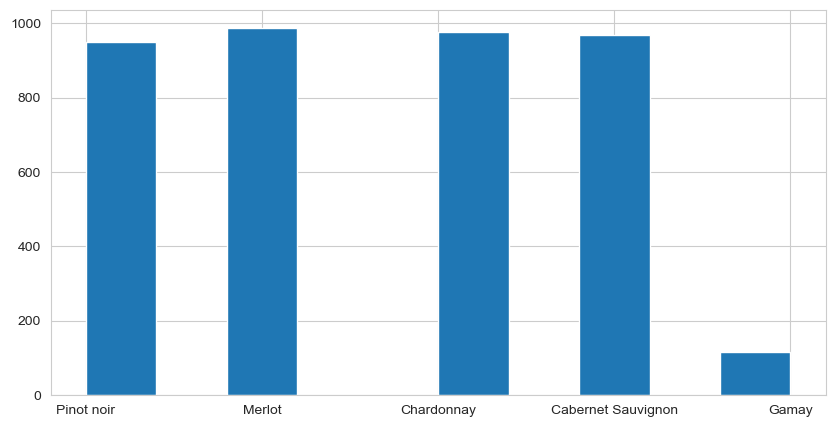

In [9]:
#Get count of values in a categorical variable
values = df_wine.wine_type.value_counts()
values
df_wine.wine_type.hist(figsize=(10,5))

While most wine varieties have a similar number of entries, Gamay seems to be underrepresented.

Since the quality feature does seem to have outliers, we decided to visualize each wine type sorted by quality.

quality  wine_type         
1        Gamay                  40
2        Gamay                  76
3        Cabernet Sauvignon      2
         Chardonnay              4
         Merlot                  4
         Pinot noir              3
4        Cabernet Sauvignon     29
         Chardonnay             40
         Merlot                 25
         Pinot noir             37
5        Cabernet Sauvignon    289
         Chardonnay            287
         Merlot                271
         Pinot noir            310
6        Cabernet Sauvignon    451
         Chardonnay            425
         Merlot                451
         Pinot noir            411
7        Cabernet Sauvignon    150
         Chardonnay            175
         Merlot                187
         Pinot noir            158
8        Cabernet Sauvignon     37
         Chardonnay             39
         Merlot                 35
         Pinot noir             25
9        Cabernet Sauvignon      1
         Chardonnay        

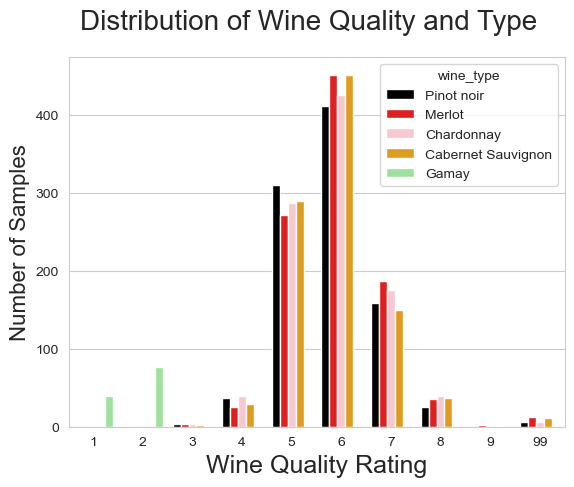

In [10]:
# Graph of the distribution

plt.suptitle("Distribution of Wine Quality and Type", fontsize=20)
plt.xlabel("xlabel", fontsize=18)
plt.ylabel("ylabel", fontsize=16)

ax = sns.countplot(
    x="quality", hue="wine_type", data=df_wine, palette=["black", "red", "pink", "orange", "lightgreen"]
)
ax.set(xlabel="Wine Quality Rating", ylabel="Number of Samples")

df_wine.groupby(["quality", "wine_type"]).size()

Two important things can be identified here:

- the quality scale from 1-10 features the entries 1-9 and 99, we will have to fix this and drop them for the time being since we consider them as  faulty/noise value.
- for task 2 our idea would be to fix the faulty 99 values with machine learning imputation, but considering it might skew (change) our dataset, we will be cautious with this procedure.
- Gamay seems to have a faulty quality score and considering it, we want to predict the quality of wine varieties, but we will have to look at this wine type separately


In [11]:
# chech number of entries with 99 score
df_99 = df_wine.loc[(df_wine["quality"] == 99)]
df_99

,wine_type,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,magnesium,flavanoids,minerals,calcium,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality
160,Cabernet Sauvignon,7.0,0.30,0.49,4.70,20.473196,1254.81,254.033196,233.56,0.036,17.0,105.0,0.99160,3.26,0.68,12.4,99
197,Chardonnay,7.7,0.39,0.30,5.20,84.279956,634.22,459.899956,375.62,0.037,29.0,131.0,0.99430,3.38,0.44,11.0,99
228,Merlot,6.0,0.26,0.32,3.80,41.128270,703.83,343.478270,302.35,0.029,48.0,180.0,0.99011,3.15,0.34,12.0,99
314,Merlot,6.7,0.24,0.33,12.30,7.650669,833.76,413.660669,406.01,0.046,31.0,145.0,0.99830,3.36,0.40,9.5,99
318,Pinot noir,6.7,0.31,0.31,9.90,84.531604,1373.87,317.871604,233.34,0.040,10.0,175.0,0.99530,3.46,0.55,11.4,99
356,Cabernet Sauvignon,6.2,0.22,0.28,2.20,67.636944,813.51,260.256944,192.62,0.040,24.0,125.0,0.99170,3.19,0.48,10.5,99
480,Pinot noir,6.7,0.35,0.32,9.00,5.727664,747.04,226.877664,221.15,0.032,29.0,113.0,0.99188,3.13,0.65,12.9,99
511,Cabernet Sauvignon,7.6,0.29,0.26,6.50,88.525416,739.03,260.785416,172.26,0.042,32.0,160.0,0.99440,3.14,0.47,10.7,99
521,Merlot,7.5,0.29,0.67,8.10,33.099116,779.77,228.629116,195.53,0.037,53.0,166.0,0.99660,2.90,0.41,8.9,99
658,Merlot,7.4,0.24,0.22,10.70,89.102417,746.90,293.002417,203.90,0.042,26.0,81.0,0.99540,2.86,0.36,9.7,99


In [12]:
# check number of entries of gamay
df_gamay = df_wine.loc[(df_wine["wine_type"] == "Gamay")]
df_gamay

,wine_type,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,magnesium,flavanoids,minerals,calcium,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality
9,Gamay,7.70,0.28,0.39,8.90,54.450579,929.44,377.690579,323.24,0.036,8.0,117.0,0.99350,3.06,0.38,12.0,2
41,Gamay,6.15,0.21,0.37,3.20,29.384680,1116.19,293.484680,264.10,0.021,20.0,80.0,0.99076,3.39,0.47,12.0,1
88,Gamay,7.10,0.22,0.33,2.80,1.593610,1149.79,124.863610,123.27,0.033,48.0,153.0,0.98990,3.15,0.38,12.7,2
91,Gamay,7.60,0.19,0.32,18.75,48.741901,969.51,375.291901,326.55,0.047,32.0,193.0,1.00014,3.10,0.50,9.3,2
108,Gamay,6.60,0.22,0.37,15.40,52.194621,932.46,225.104621,172.91,0.035,62.0,153.0,0.99845,3.02,0.40,9.3,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3757,Gamay,7.00,0.12,0.29,10.30,47.214956,1482.12,182.594956,135.38,0.039,41.0,98.0,0.99564,3.19,0.38,9.8,2
3861,Gamay,7.80,0.26,0.49,3.20,25.888285,1301.54,347.008285,321.12,0.027,28.0,87.0,0.99190,3.03,0.32,11.3,2
3893,Gamay,7.90,0.18,0.37,3.00,45.470051,988.04,244.680051,199.21,0.061,25.0,178.0,0.99500,3.22,0.51,10.0,2
3911,Gamay,7.00,0.24,0.25,1.70,28.317335,1295.30,217.397335,189.08,0.042,48.0,189.0,0.99200,3.25,0.42,11.4,2


Considering the faulty values, we need to know which other values are missing in the dataset to create clean dataframes.
Finally a Pair plot is a good way for us to see a scatter plot of all the data, using it as a bivariate tool. Since we only have a small amount of features it allows us to have a good understanding of the data and features

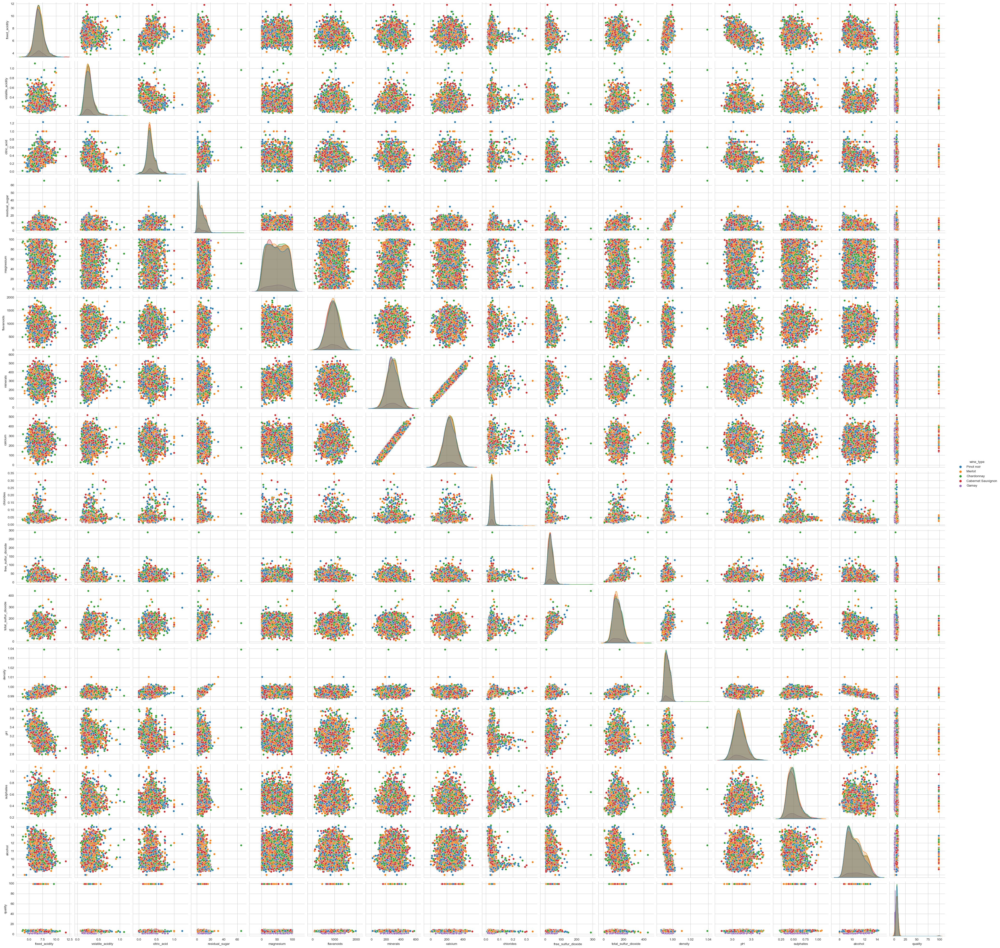

In [13]:
columns = df_wine
# pairplot with hue day
sns.pairplot(columns, hue ='wine_type')
# to show
plt.show()

Good feature combinations for us are feature combinations that separate some of the class labels. In our example there does not seem to be a good feature at first glance, which means we have to look deeper when using the feature selection.

## Missing Values

Missing values can occur by three different types:
- MCAR (Missing completely at random) -> no relationship between the missing data and any other values observed or unobserved, meaning no pattern is found
- MAR (Missing at random) -> possible reason for missing data can be explained
- MNAR (Missing not at random) -> pattern of missing data, f.e. reluctance to answer certain
Possible consequences of missing data can be:
- Reduction of model fit
- Possible biased model
- Correlations between variables fail to be deduced
As shown later, our missing data can be treated by the following methods:
- deletion
- mean/median substitute
- prediction modeling
- possible KNN substitute

Source (‘https://www.analyticsvidhya.com/blog/2021/10/handling-missing-value/’)

First we want to see how many missing values are in which feature.

In [14]:
# Nan Count per Column
df_wine.isna().sum()

wine_type               0
fixed_acidity           0
volatile_acidity        0
citric_acid             3
residual_sugar          4
magnesium               4
flavanoids              4
minerals                4
calcium                 4
chlorides               4
free_sulfur_dioxide     4
total_sulfur_dioxide    4
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64

In [15]:
# Nan Count overall
count_nan = df_wine.isna().sum().sum()

print ('Count of NaN: ' + str(count_nan))

Count of NaN: 35


<AxesSubplot:>

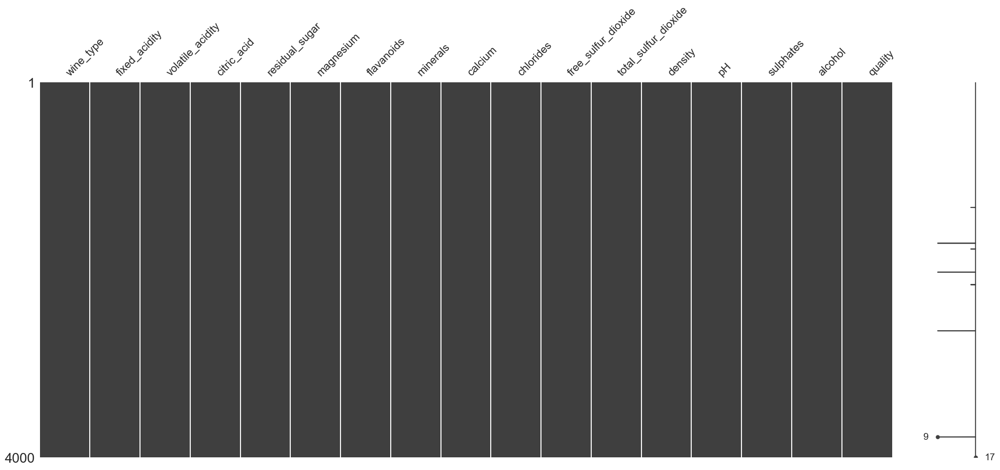

In [16]:
msno.matrix(df_wine)

In [17]:
# Show Rows of Nan Values and highlight the Nan Values
df_nan = df_wine[df_wine.isna().any(axis=1)]
df_nan
df_nan.style.highlight_null('#ff33aa')

,wine_type,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,magnesium,flavanoids,minerals,calcium,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality
1334,Chardonnay,6.400000,0.130000,nan,1.600000,96.924983,647.750000,303.424983,206.500000,0.092000,40.000000,158.000000,0.992800,3.210000,0.360000,9.800000,6
1715,Chardonnay,7.200000,0.350000,0.250000,nan,nan,nan,nan,nan,nan,nan,nan,0.993340,2.930000,0.660000,10.300000,7
1777,Pinot noir,6.400000,0.320000,nan,10.700000,47.973891,725.240000,286.333891,238.360000,0.047000,57.000000,206.000000,0.996800,3.080000,0.600000,9.400000,5
2024,Chardonnay,6.500000,0.230000,0.250000,nan,nan,nan,nan,nan,nan,nan,nan,0.998280,3.150000,0.420000,9.200000,6
2157,Pinot noir,6.700000,0.240000,nan,8.700000,46.794182,694.520000,249.224182,202.430000,0.036000,29.000000,148.000000,0.995200,3.220000,0.620000,9.900000,6
2649,Cabernet Sauvignon,7.700000,0.390000,0.280000,nan,nan,nan,nan,nan,nan,nan,nan,0.991800,3.190000,0.580000,12.200000,7
3781,Chardonnay,5.800000,0.280000,0.300000,nan,nan,nan,nan,nan,nan,nan,nan,0.989520,3.320000,0.600000,12.500000,7


<AxesSubplot:>

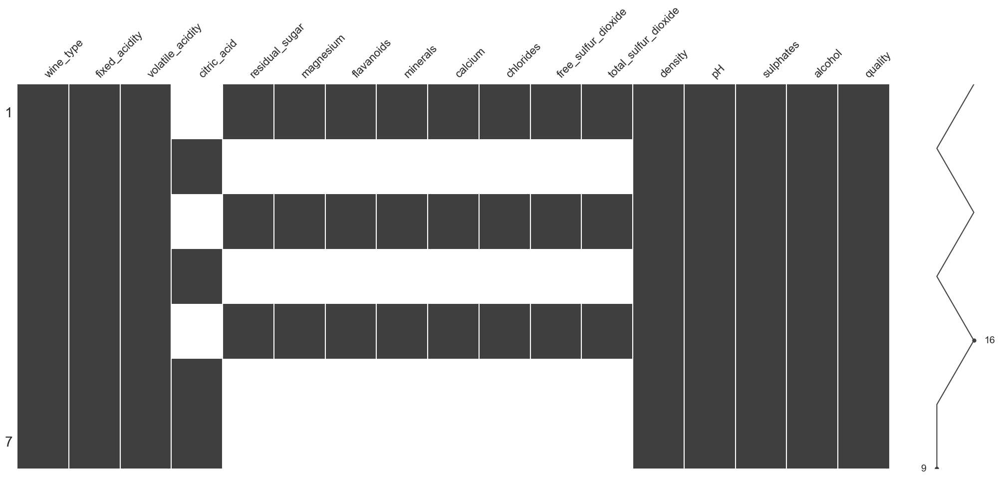

In [18]:
# Visualisation
msno.matrix(df_nan)

Missing Value Handling:
After looking at the data of the features, we believe that the data is MCAR.
Considering the fact that there are missing values in 7 rows we will handle them accordingly:

- drop rows which are missing more than 40% of data
- transform features to mean where there are less than 40% missing

40% of 17 features are 6.8 or 7 features

In [19]:
# 17 - 7 features = drop threshhold of 10
df_no_nan = df_wine.dropna(thresh=10)
print('Remaining nan values: ',df_no_nan.isna().sum().sum())
# replace remaining nan values under threshhold with mean
df_no_nan = df_no_nan.fillna(value=df_no_nan.mean())
print('Remaining nan values: ',df_no_nan.isna().sum().sum())
# example of row 1334
df_no_nan.iloc[1334]

Remaining nan values:  3
Remaining nan values:  0


/var/folders/24/6blg6t315h3bmgqnq615fm400000gn/T/ipykernel_30454/3177042577.py:5: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_no_nan = df_no_nan.fillna(value=df_no_nan.mean())


wine_type               Chardonnay
fixed_acidity                  6.4
volatile_acidity              0.13
citric_acid               0.334994
residual_sugar                 1.6
magnesium                96.924983
flavanoids                  647.75
minerals                303.424983
calcium                      206.5
chlorides                    0.092
free_sulfur_dioxide           40.0
total_sulfur_dioxide         158.0
density                     0.9928
pH                            3.21
sulphates                     0.36
alcohol                        9.8
quality                          6
Name: 1334, dtype: object

In [20]:
# adding to that we create a dataframe with no nan values and the noise of quality removed
df_wine_clean = df_no_nan[df_no_nan.quality != 99]

# also splitting gamay and non gamay wine_types
df_gamay = df_wine_clean[df_wine_clean["wine_type"]=="Gamay"].copy()
df_wine_no_gamay = df_wine_clean[df_wine_clean["wine_type"]!="Gamay"].copy()

## Noise Handling
### Encoding wine_type
Newly created categories are sorted alphabetically.

In [21]:
wine_type_array = df_wine_clean["wine_type"].to_numpy()

ohe = OneHotEncoder(sparse=False)
wine_type_transformed = ohe.fit_transform(wine_type_array.reshape(-1, 1))  # 1d array -> 2d array

```python
ohe.categories_ = [array(['Cabernet Sauvignon', 'Chardonnay', 'Gamay', 'Merlot', 'Pinot noir'], dtype=object)]
```

In [22]:
df_wine_clean[ohe.categories_[0]] = wine_type_transformed

/var/folders/24/6blg6t315h3bmgqnq615fm400000gn/T/ipykernel_30454/3448897188.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_wine_clean[ohe.categories_[0]] = wine_type_transformed
/var/folders/24/6blg6t315h3bmgqnq615fm400000gn/T/ipykernel_30454/3448897188.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_wine_clean[ohe.categories_[0]] = wine_type_transformed
/var/folders/24/6blg6t315h3bmgqnq615fm400000gn/T/ipykernel_30454/3448897188.py:1: SettingWithCopyWarning: 
A value is trying to be set on a 

In [23]:
# save one hot encoding on specific dataframe
df_wine_clean_ohe = df_wine_clean

In [24]:
# set back changes for df_wine_clean
df_wine_clean = df_no_nan[df_no_nan.quality != 99]

## Separating groups of wines

Gamay wines only have a quality of 1 or 2, while the other types of wine range from 3 to 9.

As mentioned above, Gamay wines may require a separate model to determine their quality,
Therefore, the noise should also be determined separately.

In [25]:
df_gamay_ohe = df_wine_clean_ohe[df_wine_clean_ohe["wine_type"]=="Gamay"].copy()
df_wine_no_gamay_ohe = df_wine_clean_ohe[df_wine_clean_ohe["wine_type"]!="Gamay"].copy()

Since it is an ordinal class (from 1 to 9), a regression model is chosen instead of a classification, which also takes into account how much a prediction deviates from its expected result.

### Gamay wines

In [26]:
x = df_gamay_ohe.drop(columns=["wine_type", "quality", "Cabernet Sauvignon", "Chardonnay", "Gamay", "Merlot", "Pinot noir"])
x = x.to_numpy()  # Converting to ndarray
y = df_gamay_ohe["quality"]

rgs = LinearRegression()

y_pred = cross_val_predict(rgs, x, y, cv=3)
df_gamay_ohe["predicted_quality"] = y_pred

### Non-Gamay wines

In [27]:
x = df_wine_no_gamay_ohe.drop(columns=["wine_type", "quality", "Gamay"])
x = x.to_numpy()  # Converting to ndarray
y = df_wine_no_gamay_ohe["quality"]

rgs = LinearRegression()

y_pred = cross_val_predict(rgs, x, y, cv=3)
df_wine_no_gamay_ohe["predicted_quality"] = y_pred

## Joint visualization of predictions

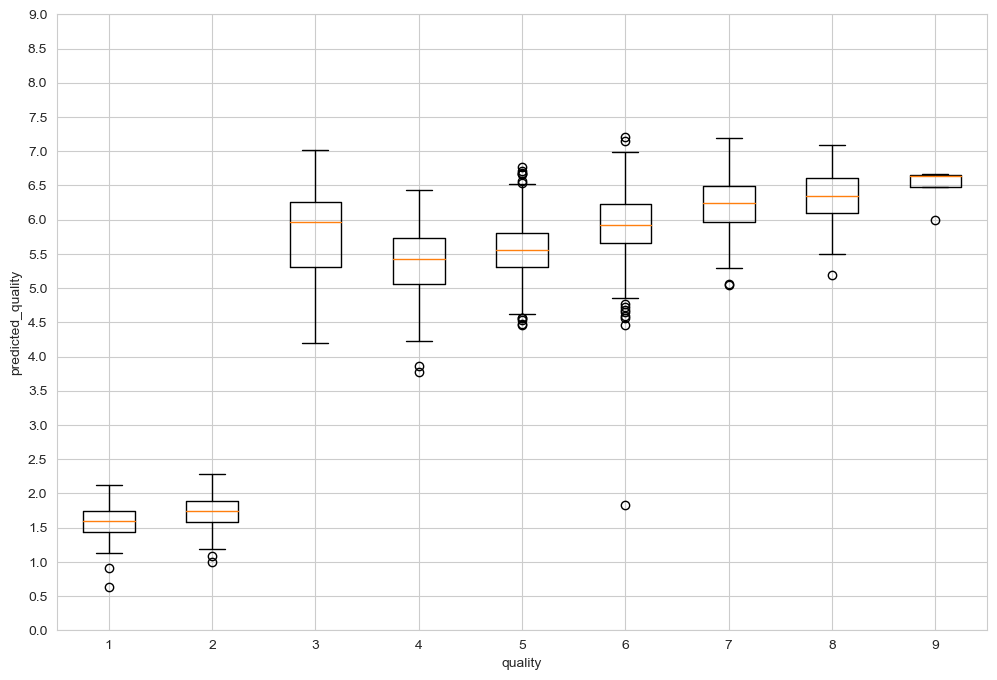

In [28]:
fig, ax = plt.subplots()
ax.boxplot(
    x=[
        df_gamay_ohe[df_gamay_ohe["quality"]==1]["predicted_quality"],
        df_gamay_ohe[df_gamay_ohe["quality"]==2]["predicted_quality"],
        df_wine_no_gamay_ohe[df_wine_no_gamay_ohe["quality"]==3]["predicted_quality"],
        df_wine_no_gamay_ohe[df_wine_no_gamay_ohe["quality"]==4]["predicted_quality"],
        df_wine_no_gamay_ohe[df_wine_no_gamay_ohe["quality"]==5]["predicted_quality"],
        df_wine_no_gamay_ohe[df_wine_no_gamay_ohe["quality"]==6]["predicted_quality"],
        df_wine_no_gamay_ohe[df_wine_no_gamay_ohe["quality"]==7]["predicted_quality"],
        df_wine_no_gamay_ohe[df_wine_no_gamay_ohe["quality"]==8]["predicted_quality"],
        df_wine_no_gamay_ohe[df_wine_no_gamay_ohe["quality"]==9]["predicted_quality"],
    ],
    positions=[1,2,3,4,5,6,7,8,9]
)
ax.set_xlabel("quality")
ax.set_ylabel("predicted_quality")
ax.set_yticks(ticks=np.arange(0, 9.5, 0.5))
ax.grid(which="major", axis="y", c="#CCCCCC")
fig.set_figwidth(12)
fig.set_figheight(8)
plt.show();

With the exception of quality tier 3, the median of the predicted qualities increases as the quality improves. Only the median of quality tier 6 comes close to its true quality.

Notably the predicted quality of most non-gamay wines ranges between 4.5 and 6.5 which does not reflect the broader range of their true qualities.

## Determining noise
Multiple iterations with different noise threshold values

In [29]:
df_result = pd.concat([df_gamay, df_wine_no_gamay_ohe])

#Calculating deviation from true quality
df_result["quality_deviation"] = df_result.apply(lambda row: row["predicted_quality"] - row["quality"], axis=1)

In [30]:
noise_level_df = pd.DataFrame()
noise_level_df["quality"] = [1,2,3,4,5,6,7,8,9]
noise_threshold_list = [0.5, 1, 1.5, 2]

for nt in noise_threshold_list:
    noise_level_list = []

    for qt in range(1, 10):
        noisy_instances_counter = 0
        qt_df = df_result[df_result["quality"]==qt]
        quality_deviation_series = qt_df["quality_deviation"]

        for val in quality_deviation_series:
            if abs(val) > nt:
                noisy_instances_counter += 1
            noisy_instances_percentage = round(noisy_instances_counter / len(quality_deviation_series), 4) * 100

        noise_level_list.append(noisy_instances_percentage)

    noise_level_df[f"threshold_{nt}"] = noise_level_list

Percentage of instances considered to be noise

In [31]:
instances_per_quality = list(df_wine_clean_ohe["quality"].value_counts().sort_index())
noise_level_df.insert(1, "n_rows", instances_per_quality)
noise_level_df

,quality,n_rows,threshold_0.5,threshold_1,threshold_1.5,threshold_2
0,1,40,0.00,0.00,0.00,0.00
1,2,76,0.00,0.00,0.00,0.00
2,3,13,100.00,100.00,92.31,84.62
3,4,131,95.42,77.86,41.98,8.40
4,5,1157,57.65,12.10,0.78,0.00
5,6,1737,22.51,1.09,0.12,0.06
6,7,667,76.16,28.19,3.00,0.00
7,8,136,100.00,98.53,65.44,21.32
8,9,4,100.00,100.00,100.00,100.00


Due to the imbalance of label classes (quality tier 5 and 6 make up 73% of instances, tier 9 only 0.01%) predicting the quality of the two majority classes produces significantly better results.

An attempt of assigning weights to the individual instances corresponding to the number of occurences of their respective classes (1 / no. of occurences) produced marginally improved results for a few combinations of quality and thresholds but lead to a higher percentage of noise in most of the others, especially regarding the majority classes.

There are different methods that may aid in circumventing the high noise levels found in the minority classes:
- Oversampling the three classes with numbers of instances in the hundreds
- Undersampling the two majority classes to be on par with the above mentioned classes
- Creating new instances of the two classes with only a handful of instances

## Outlier Handling

Outliers can occur naturally in a data or can be due to data entry errors. They can drastically change the results of the data analysis and statistical modeling. Outliers are easily detected by visualization methods, like box-plot, histogram, and scatter plot. Outliers are handled like missing values by deleting observations, transforming them, binning or grouping them, treating them as a separate group, or imputing values.

### Outliers without Gamay

First of all, we boxplot all the features to see if we have potential outliers. To see all the features in the same range, we need to normalize the data with the MinMaxScaler.

We will do this for the first 8 features.

<AxesSubplot:>

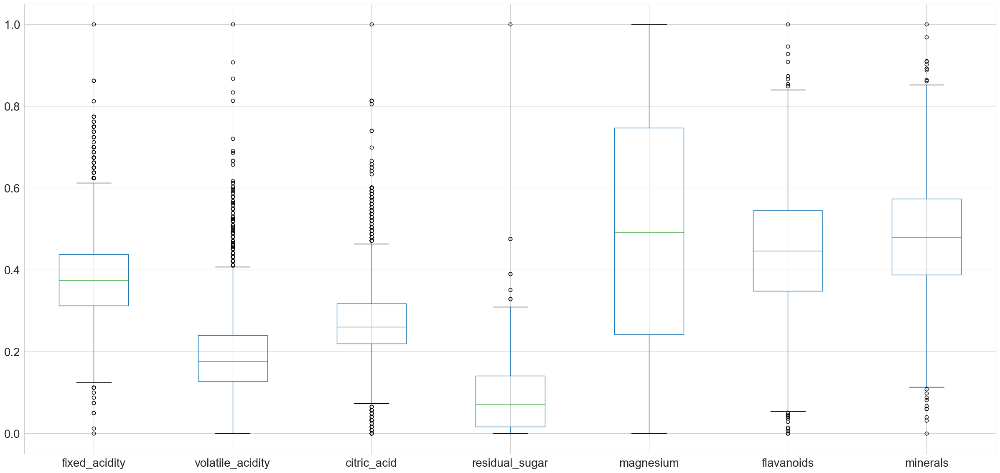

In [32]:
# Boxplots
df_boxplots=df_wine_no_gamay.iloc[:,1:8]
df_boxplots
scaler=preprocessing.MinMaxScaler()
scaled_df=pd.DataFrame(scaler.fit_transform(df_boxplots), columns=df_boxplots.columns)
scaled_df.boxplot(figsize=[30,14], fontsize=20)

<AxesSubplot:>

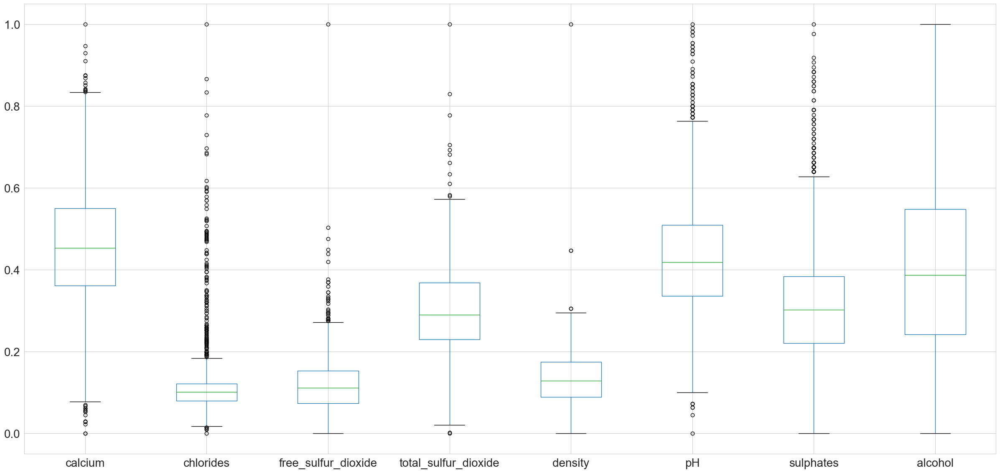

In [33]:
# Boxplots
df_boxplots=df_wine_no_gamay.iloc[:,8:16]
df_boxplots
scaler=preprocessing.MinMaxScaler()
scaled_df=pd.DataFrame(scaler.fit_transform(df_boxplots), columns=df_boxplots.columns)
scaled_df.boxplot(figsize=[30,14], fontsize=20)

As we can see, we have potential outliers in all of the features except for 'magnesium' and 'alcohol'.

Therefore we will do an univariate analysis for those features with potential outliers.

For the univariate analysis we calculate the boundaries for the standard deviation multiplied with the factor 3. All values outside these boundaries we consider as outliers.
To improve the readability of the notebook we use the function 'univariate_outlier_analysis' to process repeating tasks

## Functions Univariate Analysis

In [34]:
def univariate_outlier_analysis(feature_names, df_wine, num_bins=20):
    # Initialize count for all outliers
    count_all_outliers = 0

    # Initialize list for all outlier indices
    all_outlier_indices = []
    for feature_name in feature_names:

        print("Analysis of:", feature_name)
        df_feature1 = df_wine[feature_name]

        #calculate the three-standard-deviation
        three_std=df_feature1.std()*3

        # calculate the mean value
        mean=df_feature1.mean()

        # calculate the bounds
        # if the lower boundary is negative we set the inlier low = 0, because wine ingredients can't be negative
        inlier_low=mean-three_std if mean-three_std >= 0 else 0
        inlier_high=mean+three_std

        # Initialize the count of outliers of the feature
        cnt = 0
        # Initialize the list of values for getting the index in further steps
        list_of_values = []
        for value in df_feature1:
            if value < inlier_low or value > inlier_high:
                cnt += 1
                list_of_values.append(value)
                #print(value," is a potential outlier")
        max_outlier = None
        if len(list_of_values) > 0:
            max_outlier = max(list_of_values) if len(list_of_values) >= 0 else None
        # initialize the plot
        x = df_wine[feature_name]
        plt.hist(x, bins=num_bins)
        plt.title(feature_name)
        plt.axvline(x=inlier_low, color = 'b', label = 'low')
        plt.axvline(x=inlier_high, color = 'b', label = 'high')
        if len(list_of_values) > 0:
            plt.axvline(x=max_outlier, color = 'red', label = 'max outlier')
        plt.show()

        print("mean: ",round(mean, 3), "\nlower boundary inlier: ",round(inlier_low,3), "\nupper boundary inlier",round(inlier_high, 3), "\n")

        # Initialize the count of outliers of the feature
        cnt = 0
        # Initialize the list of values for getting the index in further steps
        list_of_values = []
        for value in df_feature1:
            if value < inlier_low or value > inlier_high:
                cnt += 1
                list_of_values.append(value)
                #print(value," is a potential outlier")

        # Add the count of the specific feature to how many outliers we have on all features
        count_all_outliers += cnt

        # Get the indices of the outliers with the list of values
        indices = df_wine.index[df_wine[feature_name].isin(list_of_values)].tolist()

        # Extend the list with all outlier indices by the indices of the specific feature
        all_outlier_indices.extend(indices)
        print("Maximum Outlier detected:", max_outlier)
        print("Count of outliers of", feature_name + ": ", cnt)
        #print("Indices of", feature_name + ": ", indices)
        print("__________________________________\n\n")

    # only get unique values of all outliers
    all_outlier_indices=set(all_outlier_indices)

    print("\nTotal outliers: ", count_all_outliers)
    print("\nCount of unique outlier indices: ", len(all_outlier_indices))
    return all_outlier_indices

## Univariate Analysis (without Gamay)
For wine ingredients without the wine type Gamay

Analysis of: fixed_acidity


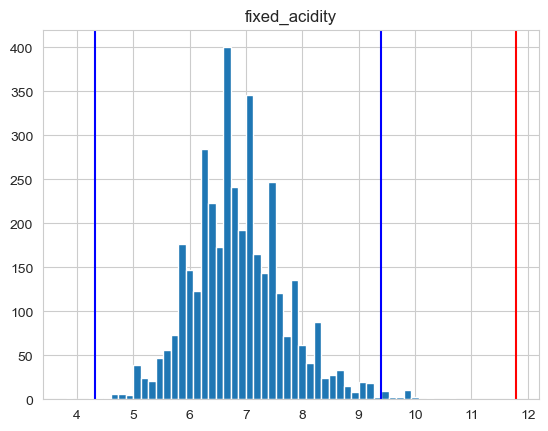

mean:  6.855 
lower boundary inlier:  4.322 
upper boundary inlier 9.389 

Maximum Outlier detected: 11.8
Count of outliers of fixed_acidity:  36
__________________________________


Analysis of: volatile_acidity


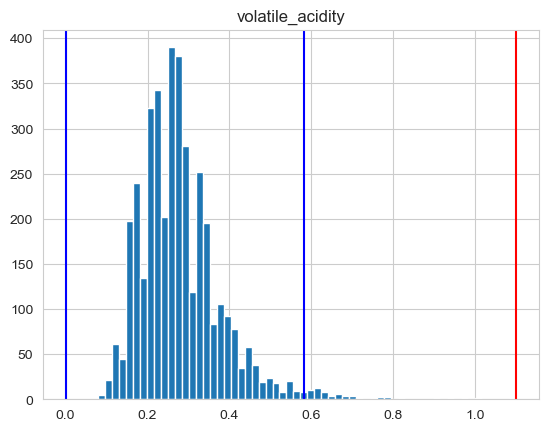

mean:  0.279 
lower boundary inlier:  0 
upper boundary inlier 0.582 

Maximum Outlier detected: 1.1
Count of outliers of volatile_acidity:  63
__________________________________


Analysis of: citric_acid


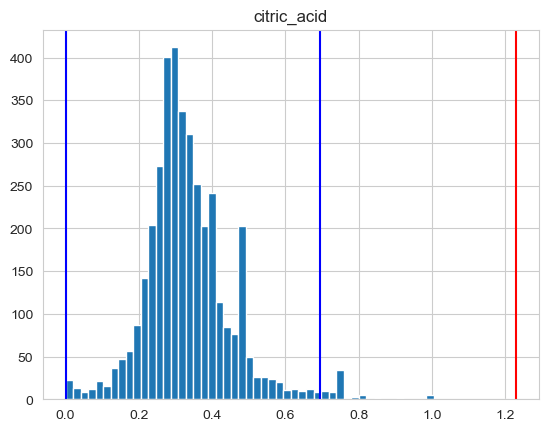

mean:  0.335 
lower boundary inlier:  0 
upper boundary inlier 0.695 

Maximum Outlier detected: 1.23
Count of outliers of citric_acid:  70
__________________________________


Analysis of: residual_sugar


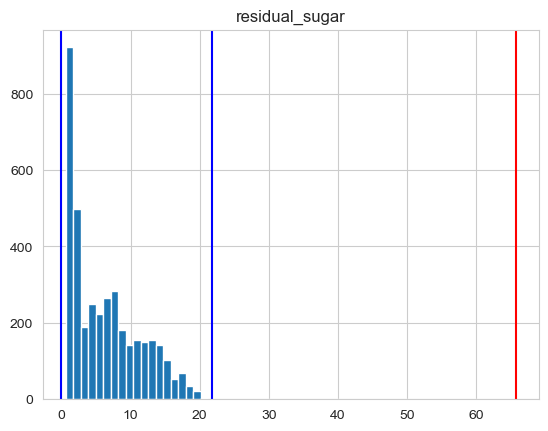

mean:  6.402 
lower boundary inlier:  0 
upper boundary inlier 21.754 

Maximum Outlier detected: 65.8
Count of outliers of residual_sugar:  8
__________________________________


Analysis of: flavanoids


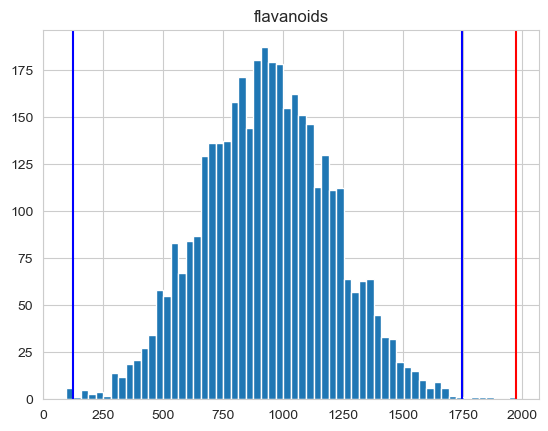

mean:  934.723 
lower boundary inlier:  122.345 
upper boundary inlier 1747.101 

Maximum Outlier detected: 1974.85
Count of outliers of flavanoids:  10
__________________________________


Analysis of: minerals


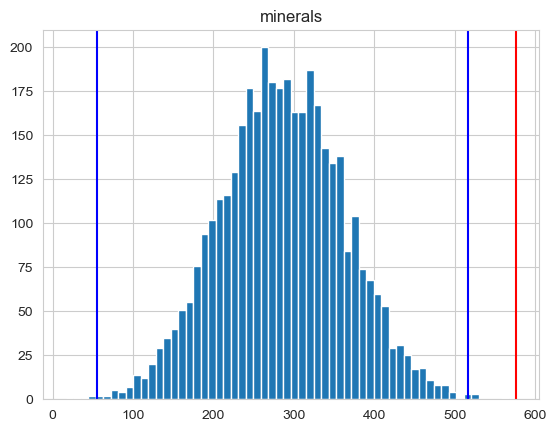

mean:  285.526 
lower boundary inlier:  54.948 
upper boundary inlier 516.104 

Maximum Outlier detected: 576.7612624489855
Count of outliers of minerals:  12
__________________________________


Analysis of: calcium


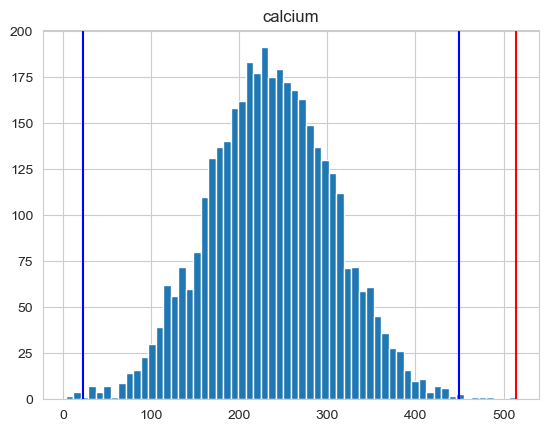

mean:  236.14 
lower boundary inlier:  22.55 
upper boundary inlier 449.73 

Maximum Outlier detected: 514.52
Count of outliers of calcium:  12
__________________________________


Analysis of: chlorides


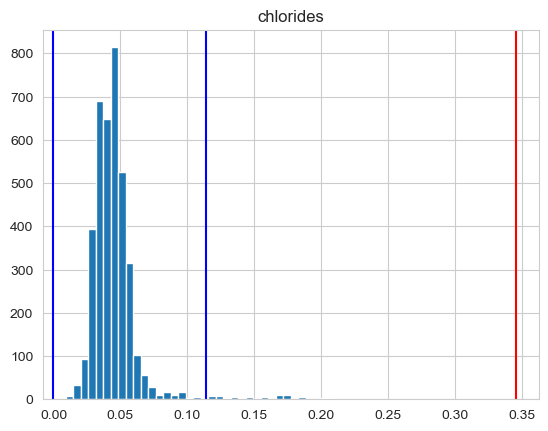

mean:  0.046 
lower boundary inlier:  0 
upper boundary inlier 0.114 

Maximum Outlier detected: 0.346
Count of outliers of chlorides:  82
__________________________________


Analysis of: free_sulfur_dioxide


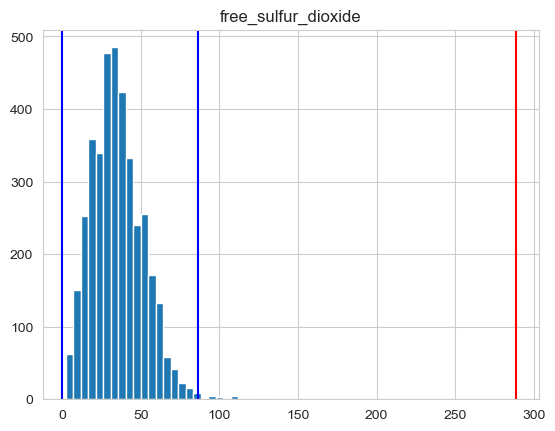

mean:  35.162 
lower boundary inlier:  0 
upper boundary inlier 86.394 

Maximum Outlier detected: 289.0
Count of outliers of free_sulfur_dioxide:  24
__________________________________


Analysis of: total_sulfur_dioxide


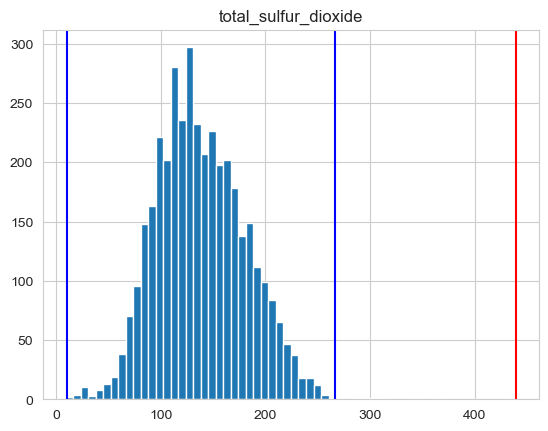

mean:  138.748 
lower boundary inlier:  10.636 
upper boundary inlier 266.86 

Maximum Outlier detected: 440.0
Count of outliers of total_sulfur_dioxide:  11
__________________________________


Analysis of: density


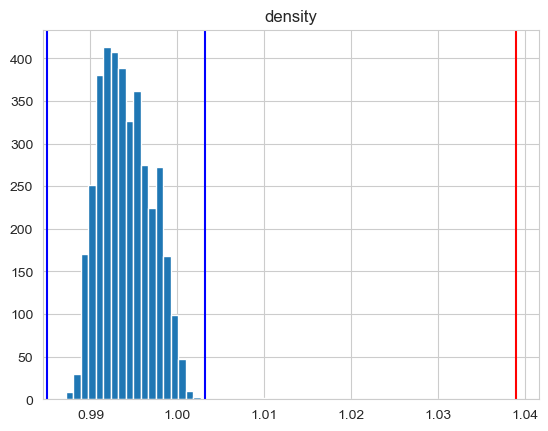

mean:  0.994 
lower boundary inlier:  0.985 
upper boundary inlier 1.003 

Maximum Outlier detected: 1.03898
Count of outliers of density:  3
__________________________________


Analysis of: pH


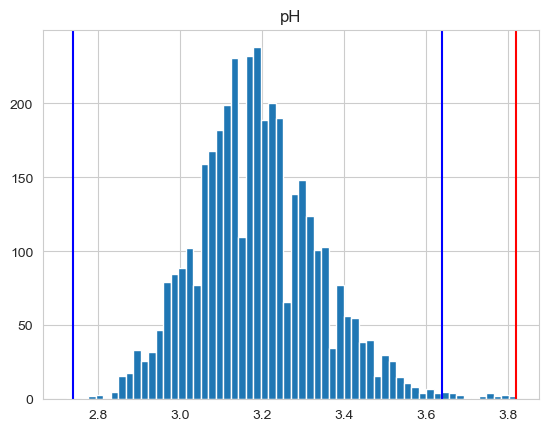

mean:  3.188 
lower boundary inlier:  2.738 
upper boundary inlier 3.638 

Maximum Outlier detected: 3.82
Count of outliers of pH:  28
__________________________________


Analysis of: sulphates


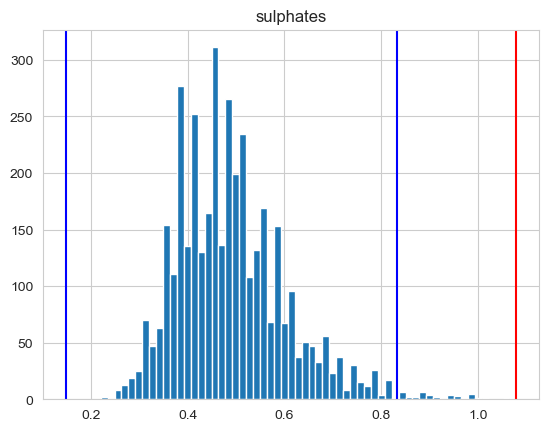

mean:  0.49 
lower boundary inlier:  0.147 
upper boundary inlier 0.833 

Maximum Outlier detected: 1.08
Count of outliers of sulphates:  39
__________________________________



Total outliers:  398

Count of unique outlier indices:  344


In [35]:
"""initialize the list for features
"""

feature_names = list(df_wine_no_gamay.columns)

# As we said before we're only analyzing certain features with potential outliers
feature_names.remove('magnesium')
feature_names.remove('alcohol')
feature_names.remove('wine_type')
feature_names.remove('quality')

all_outlier_indices_no_gamay = univariate_outlier_analysis(feature_names, df_wine_no_gamay, 60)

## Multivariate Analysis (without Gamay)

In [36]:
df_wine_no_gamay_multi = df_wine_no_gamay.iloc[:,1:]

# =============================================#
# identify outliers in the training dataset
#lof = LocalOutlierFactor()


# grid search
# grid_search = GridSearchCV(estimator=lof, scoring='accuracy', param_grid={'n_neighbors': [5, 6, 7, 8, 9, 10]}, cv=5)
#
# X = df_wine_no_gamay_multi.drop(['quality'], axis = 1)
# y = df_wine_no_gamay_multi
#
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.25, random_state=0)
#grid_search.fit(X_train, y_train)
#print("Best fitting 'n_neighbour': ", grid_search.best_params_['n_neighbors'])
# =============================================#
lof2 = LocalOutlierFactor(n_neighbors=20)
y_out = lof2.fit_predict(df_wine_no_gamay_multi)

# add outliers true/false indicator to df
df_wine_no_gamay_multi['outliers'] = y_out != -1

# show value counts
print(df_wine_no_gamay_multi['outliers'].value_counts(), "\n")

# filter dataframe by value True
filtered_inliers=df_wine_no_gamay_multi[df_wine_no_gamay_multi['outliers']==False]

# list with indices
indices_list=filtered_inliers.index.values
print("Len:", len(indices_list), "\nList:",indices_list)

# data frame with outliers
df_wine_no_gamay_multi_filtered = df_wine_no_gamay_multi.filter(items=filtered_inliers.index.values, axis=0)
df_wine_no_gamay_multi_filtered

True     3816
False      29
Name: outliers, dtype: int64 

Len: 29 
List: [ 177  389  393  499  520  833  903  928  966 1109 1126 1651 1828 1951
 2221 2248 2300 2357 2402 2549 2721 3063 3176 3186 3257 3698 3715 3939
 3973]


,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,magnesium,flavanoids,minerals,calcium,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality,outliers
177,6.1,0.260,0.25,2.90,99.968815,1064.87,322.198815,222.23,0.047,289.0,440.0,0.99314,3.44,0.64,10.5,3,False
389,6.5,0.080,0.33,1.90,23.828361,1310.85,49.678361,25.85,0.028,23.0,93.0,0.99100,3.34,0.70,12.0,7,False
393,6.8,0.705,0.25,3.20,15.456472,1839.69,190.296472,174.84,0.048,10.0,57.0,0.99600,3.36,0.52,9.5,4,False
499,6.3,0.240,0.55,8.10,44.748284,923.32,559.268284,514.52,0.040,67.0,216.0,0.99596,3.24,0.50,9.2,5,False
520,6.6,0.170,0.35,2.60,87.430231,663.94,513.820231,426.39,0.030,33.0,78.0,0.99146,3.22,0.72,11.3,6,False
833,6.9,0.190,0.49,6.60,49.012460,172.00,460.162460,411.15,0.036,49.0,172.0,0.99320,3.20,0.27,11.5,6,False
903,6.7,0.340,0.30,15.60,73.701087,679.05,76.701087,3.00,0.054,51.0,196.0,0.99820,3.19,0.49,9.3,5,False
928,7.5,0.410,0.23,14.80,97.809706,918.95,100.809706,3.00,0.054,28.0,174.0,0.99898,3.18,0.49,9.7,5,False
966,7.1,0.490,0.22,2.00,61.591272,1160.31,340.391272,278.80,0.047,146.5,307.5,0.99240,3.24,0.37,11.0,3,False
1109,5.8,0.270,0.40,1.20,15.542308,658.11,33.932308,18.39,0.076,47.0,130.0,0.99185,3.13,0.45,10.3,6,False


## Outlier Conclusion (without Gamay)

First we compare the indices of the univariate outliers with the indices of multivariate outlier analysis to see if we have matching indices.

So we can see if those two outlier detection methods detect similar outliers.

In [37]:
indices_match_multi_univariate=list(set(indices_list).intersection(all_outlier_indices_no_gamay))
print(len(indices_match_multi_univariate))
print(indices_match_multi_univariate)

filtered_df_other_wine_types=df_wine_no_gamay_multi.loc[df_wine_no_gamay_multi.index.isin(indices_match_multi_univariate)]

filtered_df_other_wine_types.describe()

23
[389, 3973, 903, 393, 1951, 928, 2721, 1828, 2221, 177, 3257, 966, 2248, 1109, 2402, 3939, 3176, 3186, 499, 1651, 3698, 3063, 2300]


,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,magnesium,flavanoids,minerals,calcium,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality
count,23.000000,23.000000,23.000000,23.000000,23.000000,23.000000,23.000000,23.000000,23.000000,23.000000,23.000000,23.000000,23.000000,23.000000,23.000000,23.000000
mean,7.121739,0.318261,0.320870,7.510870,48.903543,1125.040435,265.221369,216.317826,0.054000,67.934783,211.521739,0.996017,3.275652,0.518261,10.021739,5.043478
std,1.072362,0.137903,0.098623,6.283184,33.542227,360.699999,186.177293,169.781280,0.011592,62.734706,100.408764,0.003185,0.139864,0.092129,0.815730,1.065076
min,5.800000,0.080000,0.170000,1.100000,1.415445,658.110000,16.045445,3.000000,0.028000,10.000000,57.000000,0.991000,3.040000,0.370000,8.800000,3.000000
25%,6.250000,0.235000,0.250000,1.800000,15.499390,921.135000,88.755396,28.055000,0.047500,30.500000,134.000000,0.993830,3.180000,0.445000,9.450000,5.000000
50%,6.800000,0.270000,0.310000,5.800000,44.748284,1047.260000,267.400656,222.230000,0.054000,47.000000,196.000000,0.995960,3.270000,0.510000,9.700000,5.000000
75%,7.700000,0.390000,0.365000,15.175000,82.680924,1239.840000,392.173830,322.940000,0.058000,71.500000,292.500000,0.997770,3.350000,0.570000,10.500000,6.000000
max,9.400000,0.705000,0.560000,17.800000,99.968815,1974.850000,576.761262,514.520000,0.081000,289.000000,440.000000,1.002410,3.600000,0.700000,12.000000,7.000000


## Conclusion (without Gamay)

In our Gamay Dataset we have a total of 398 univariat outlier values. Our LOF Method found 29 outlier rows with n_neighbors=20.
For training our Model in Task 2 we have a few options:
- replace the univariate detected outliers with mean values for the specific feature
- try out other values for n_neighbors in the LOF method and maybe drop those outliers if outliers are present


## Univariate Analyse (with Gamay)
For wine ingredients with the wine type Gamay

<AxesSubplot:>

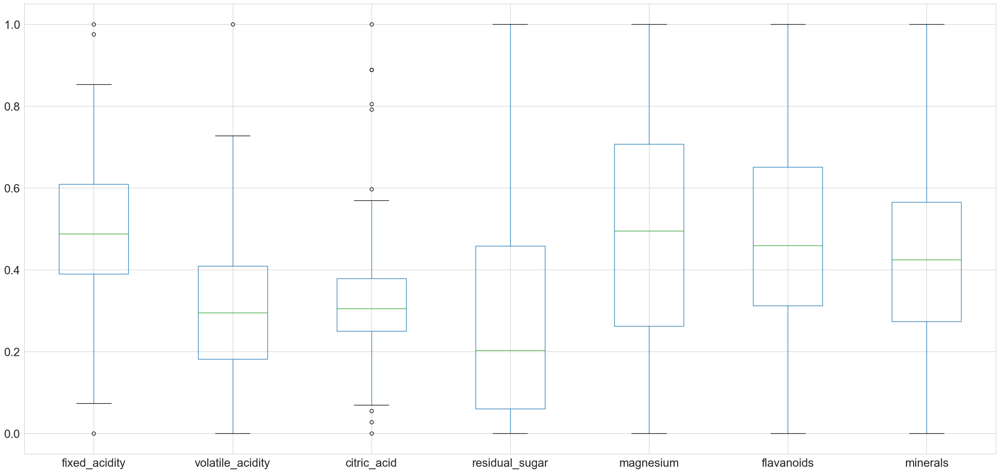

In [38]:
# Boxplots
df_boxplots=df_gamay.iloc[:,1:8]
df_boxplots
scaler=preprocessing.MinMaxScaler()
scaled_df=pd.DataFrame(scaler.fit_transform(df_boxplots), columns=df_boxplots.columns)
scaled_df.boxplot(figsize=[30,14], fontsize=20)

<AxesSubplot:>

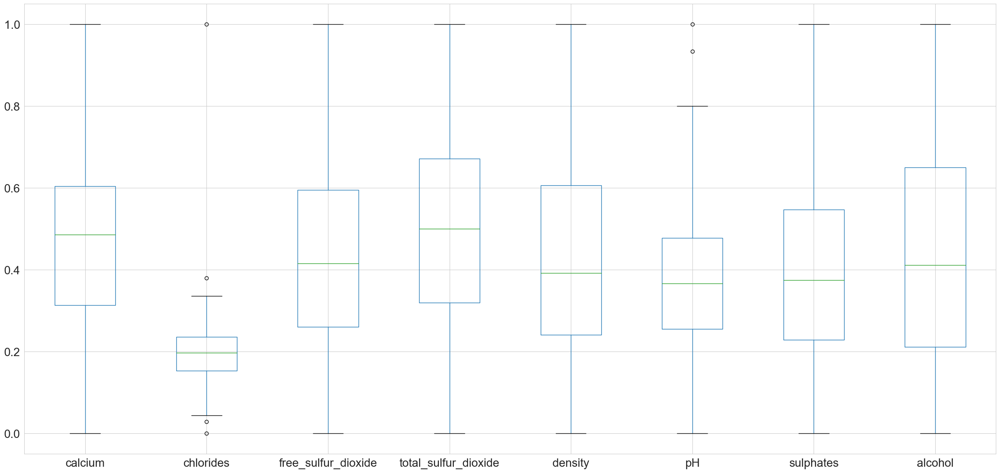

In [39]:
# Boxplots
df_boxplots=df_gamay.iloc[:,8:16]
df_boxplots
scaler=preprocessing.MinMaxScaler()
scaled_df=pd.DataFrame(scaler.fit_transform(df_boxplots), columns=df_boxplots.columns)
scaled_df.boxplot(figsize=[30,14], fontsize=20)

## Univariate Analyse (with Gamay)
For wine ingredients with the wine type Gamay

Analysis of: fixed_acidity


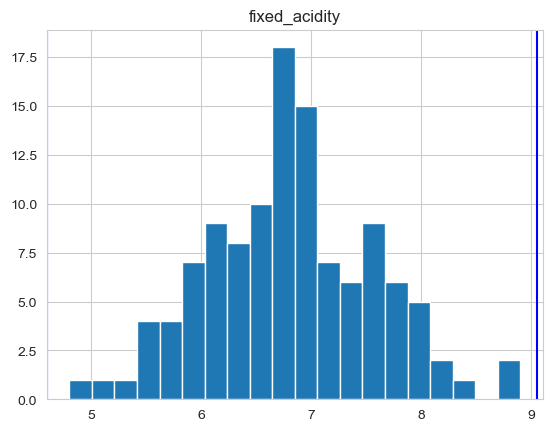

mean:  6.823 
lower boundary inlier:  4.596 
upper boundary inlier 9.05 

Maximum Outlier detected: None
Count of outliers of fixed_acidity:  0
__________________________________


Analysis of: volatile_acidity


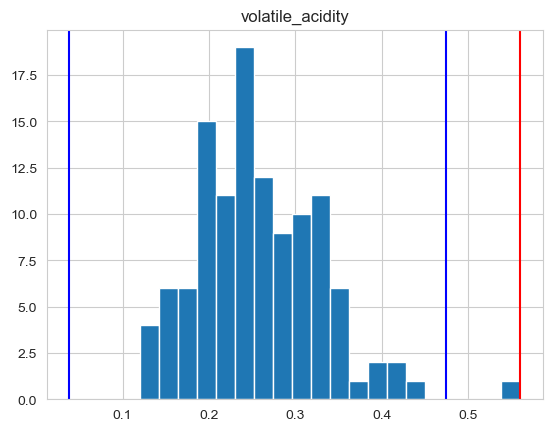

mean:  0.256 
lower boundary inlier:  0.039 
upper boundary inlier 0.474 

Maximum Outlier detected: 0.56
Count of outliers of volatile_acidity:  1
__________________________________


Analysis of: citric_acid


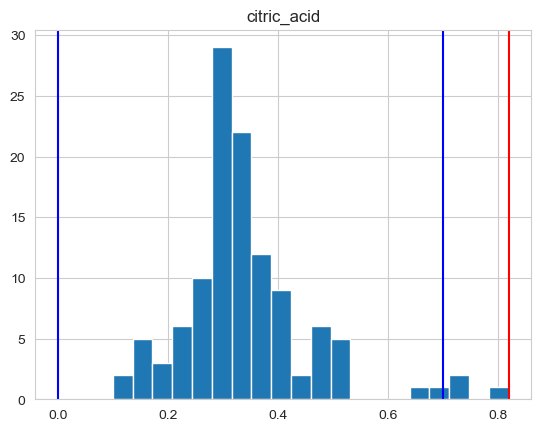

mean:  0.34 
lower boundary inlier:  0 
upper boundary inlier 0.7 

Maximum Outlier detected: 0.82
Count of outliers of citric_acid:  3
__________________________________


Analysis of: chlorides


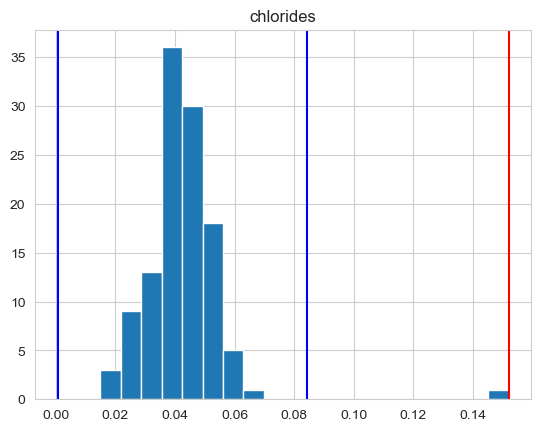

mean:  0.042 
lower boundary inlier:  0.001 
upper boundary inlier 0.084 

Maximum Outlier detected: 0.152
Count of outliers of chlorides:  1
__________________________________


Analysis of: pH


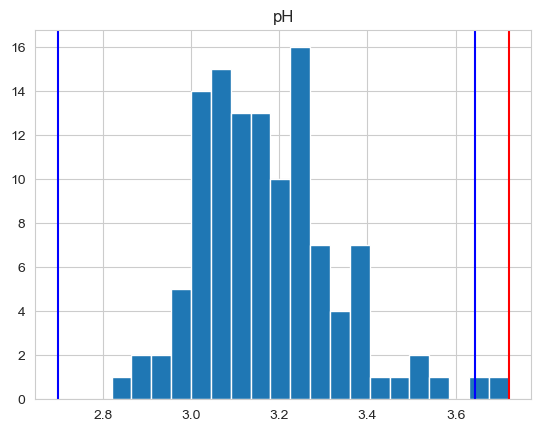

mean:  3.17 
lower boundary inlier:  2.698 
upper boundary inlier 3.643 

Maximum Outlier detected: 3.72
Count of outliers of pH:  2
__________________________________



Total outliers:  7

Count of unique outlier indices:  6


In [40]:
"""initialize the list for features
"""
# ToDo: Dokumentation
feature_names = ['fixed_acidity', 'volatile_acidity', 'citric_acid', 'chlorides', 'pH']

all_outlier_indices_gamay = univariate_outlier_analysis(feature_names, df_gamay)

## Multivariate Analysis (with Gamay)

In [41]:
df_gamay_multi = df_gamay.iloc[:,1:]
# =============================================#
# identify outliers in the training dataset
#lof = LocalOutlierFactor()


# grid search
# grid_search = GridSearchCV(estimator=lof, scoring='accuracy', param_grid={'n_neighbors': [5, 6, 7, 8, 9, 10]}, cv=5)
#
# X = df_gamay_multi.drop(['quality'], axis = 1)
# y = df_gamay_multi
#
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.25, random_state=0)
#grid_search.fit(X_train, y_train)
#print("Best fitting 'n_neighbour': ", grid_search.best_params_['n_neighbors'])
# =============================================#

lof2 = LocalOutlierFactor(n_neighbors=20)
y_out = lof2.fit_predict(df_gamay_multi)

# add outliers true/false indicator to df
df_gamay_multi['outliers'] = y_out != -1

# show value counts
print(df_gamay_multi['outliers'].value_counts(), "\n")

# filter dataframe by value True
filtered_inliers_gamay=df_gamay_multi[df_gamay_multi['outliers']==False]

# list with indices
indices_list_gamay=filtered_inliers_gamay.index.values
print("Len:", len(indices_list_gamay), "\nList:",indices_list_gamay)
# data frame with outliers
df_gamay_multi_filtered=df_gamay_multi.filter(items=filtered_inliers_gamay.index, axis=0)
df_gamay_multi_filtered

True    116
Name: outliers, dtype: int64 

Len: 0 
List: []


,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,magnesium,flavanoids,minerals,calcium,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality,outliers


## Outlier Conclusion (with Gamay)

In our Gamay Dataset we have a total of 0 outlier values. Our LOF Method did not find any outliers with n_neighbors=20.
For training our Model in Task 2 we have a few options:
- replace the univariate detected outliers with mean values for the specific feature
- try out other values for n_neighbors in the LOF method and maybe drop those outliers if outliers are present

## Scatterplot Functions

In [42]:
def list_all_pairs_of_list(input_list):
    pairs = []
    for i in range(len(input_list)):
        for j in range(i+1, len(input_list)):
            if input_list[i] != input_list[j]:
                pairs.append((input_list[i], input_list[j]))
    return pairs

def get_pairs_with_high_correlation(df, column_list, corr=0.5):
    pairs=dict()
    for pair in list_all_pairs_of_list(column_list):
        x = pair[0]
        y = pair[1]
        if df[x].dtypes == df[y].dtypes:
            correlation = df[x].corr(df[y], method='pearson')
            if correlation >= corr:
                pairs[round(correlation, 3)] = [x, y]
    return pairs

def assign_color(row):
    if row['outliers'] == True:
        return 'red'
    else:
        return 'limegreen'

def scatterplots_of_pairs(df, title="default"):
    plt.figure(figsize=(8, 8))
    plt.scatter(
        x=df[df.columns[0]],
        y=df[df.columns[1]],
        c=df['color'],
        alpha=0.4
    )
    plt.title(title, fontsize=20)
    return plt

## Scatterplots showing outliers without Gamay

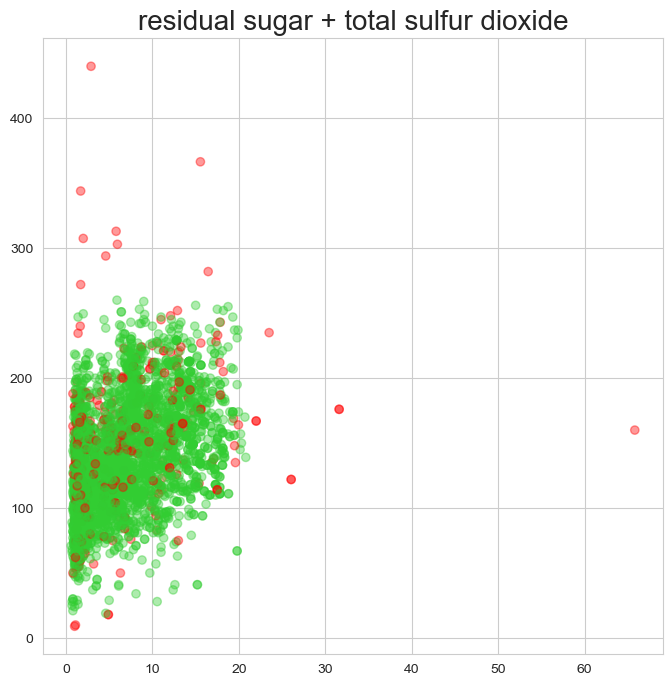

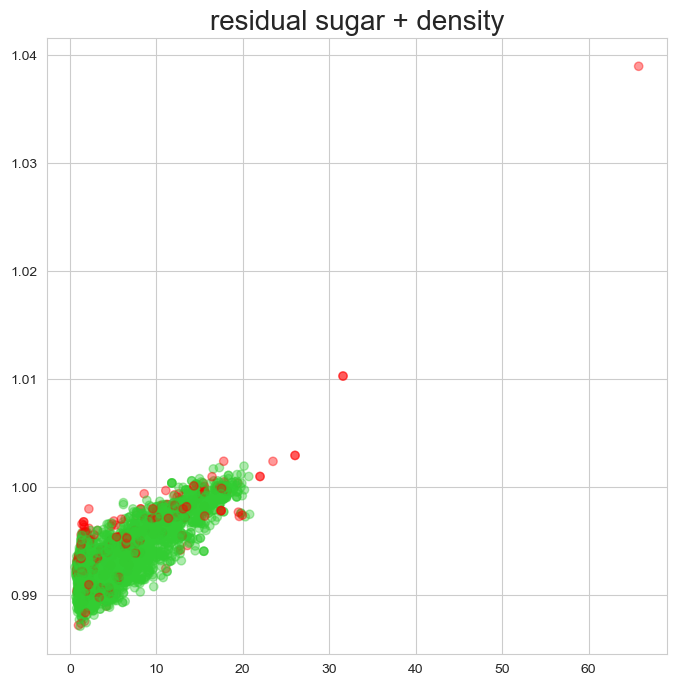

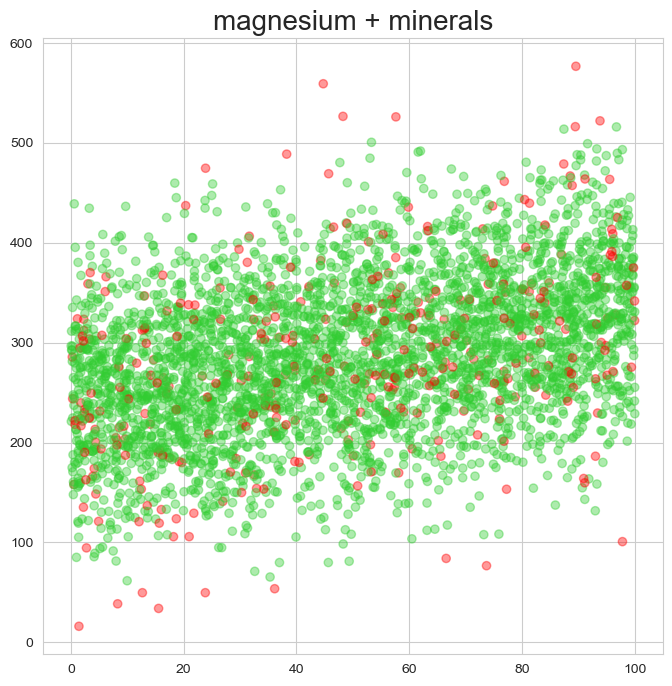

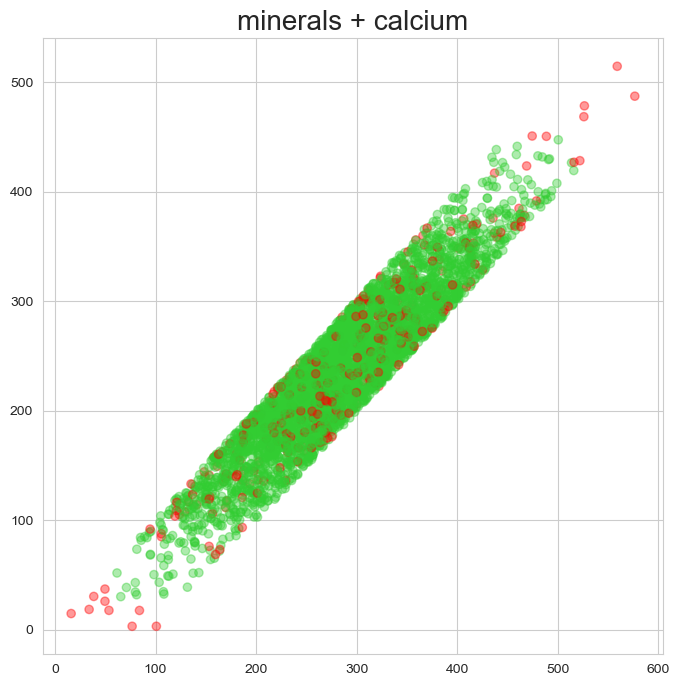

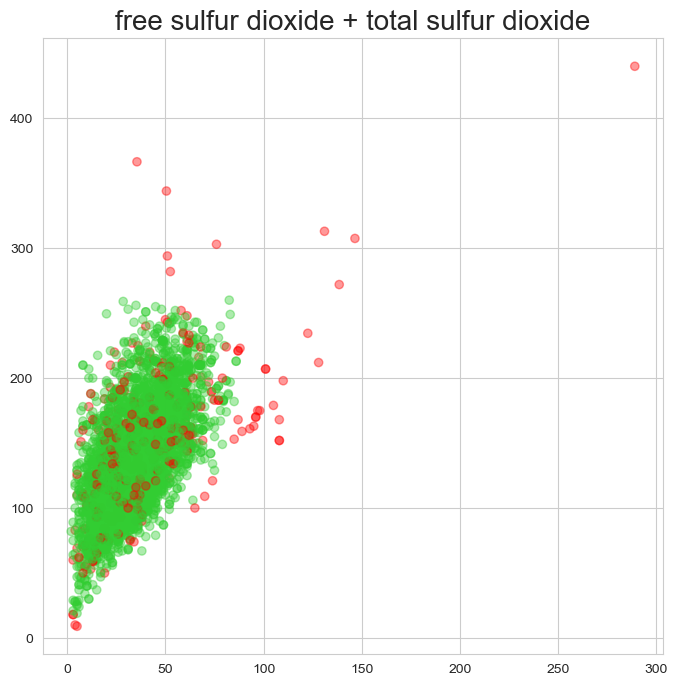

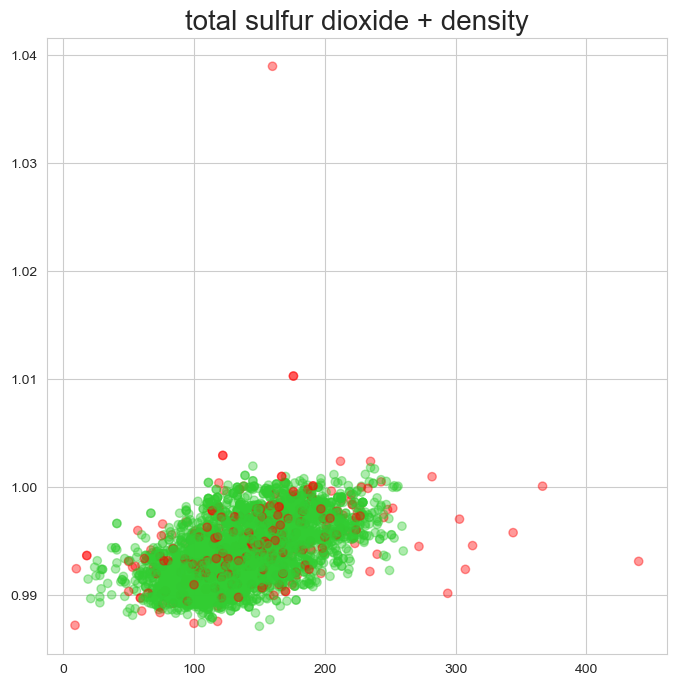

In [43]:
# prepare data frame and remove quality
df_wine_no_gamay_scat_temp = df_wine_no_gamay.iloc[:, 1:]
df_wine_no_gamay_scat = df_wine_no_gamay_scat_temp.drop(["quality"], axis=1)

# get all possible pars from highly correlated features
dict_with_pairs_no_gamay=get_pairs_with_high_correlation(df_wine_no_gamay_scat, df_wine_no_gamay_scat.columns, 0.3)

# add column 'outliers' with NaN values
df_wine_no_gamay_scat = df_wine_no_gamay_scat.assign(outliers=np.nan)

# add outlier indices
df_wine_no_gamay_scat.loc[df_wine_no_gamay_scat.index.isin(all_outlier_indices_no_gamay), 'outliers'] = True
df_wine_no_gamay_scat['color'] = df_wine_no_gamay_scat.apply(assign_color, axis=1)

if len(df_wine_no_gamay_scat.loc[df_wine_no_gamay_scat['outliers']==True]) > 0:
    for pair in dict_with_pairs_no_gamay:
        df_origin=df_wine_no_gamay_scat
        x = dict_with_pairs_no_gamay[pair][0]
        y = dict_with_pairs_no_gamay[pair][1]
        data={x: df_origin[x].values, y: df_origin[y].values, 'outlier': df_origin['outliers'].values, 'color': df_origin['color'].values}
        df = pd.DataFrame(data, columns=[x, y,'outliers', 'color'])
        scatterplots_of_pairs(df, title=x.replace('_', ' ')+" + "+y.replace('_', ' '))
else:
    print("no outliers")

## Scatterplots showing outliers with Gamay

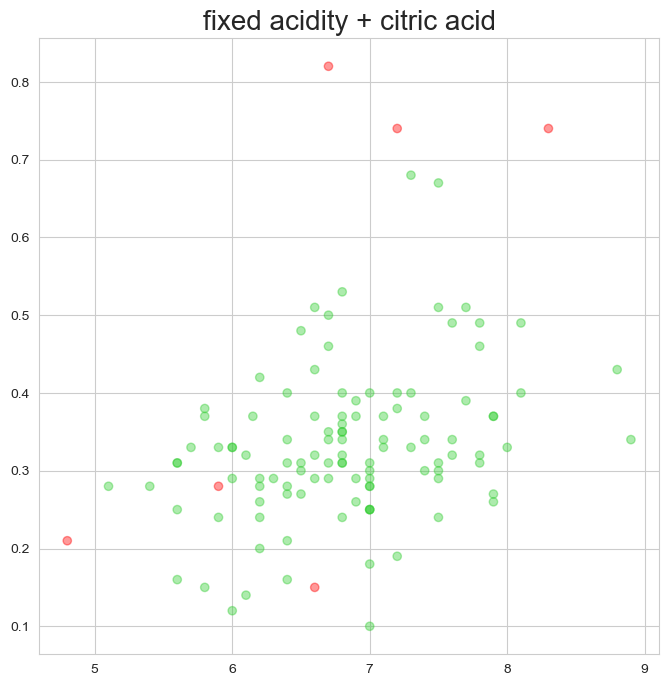

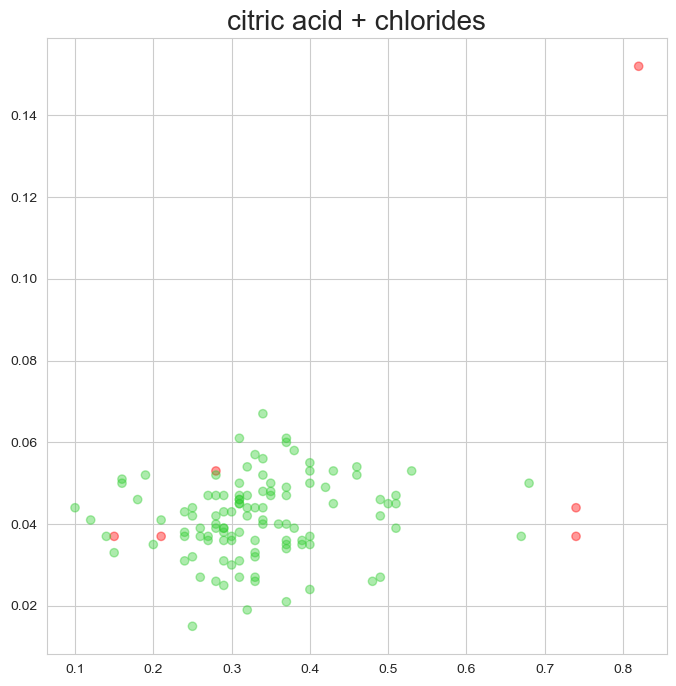

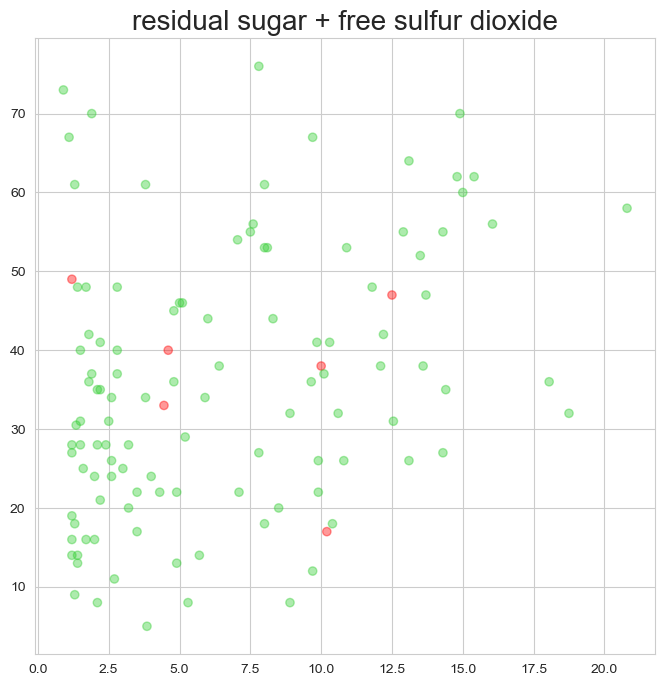

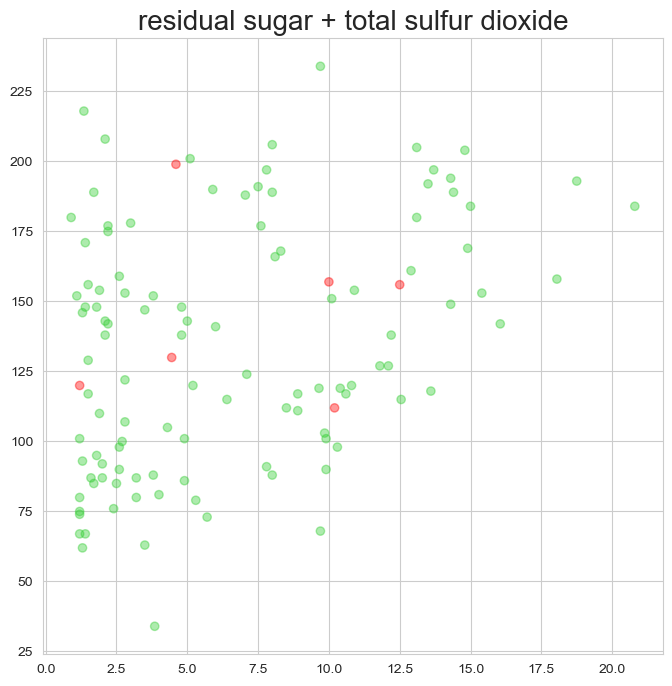

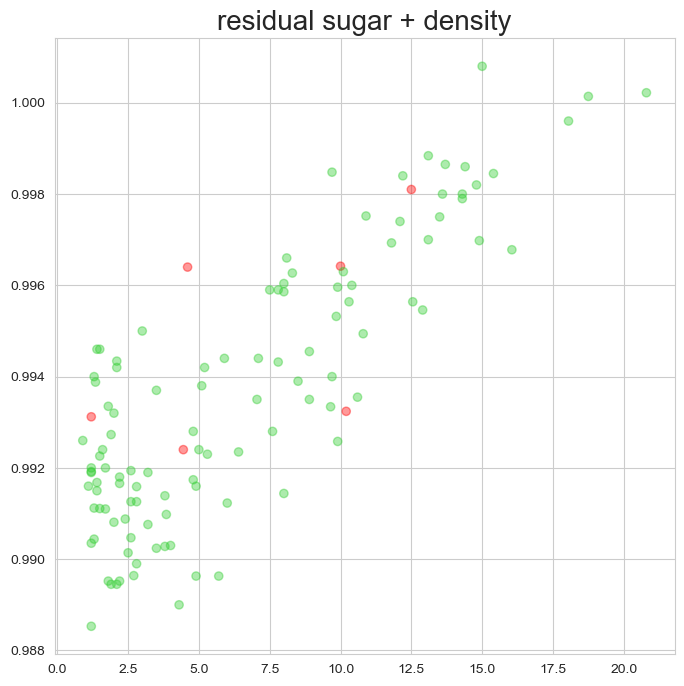

...

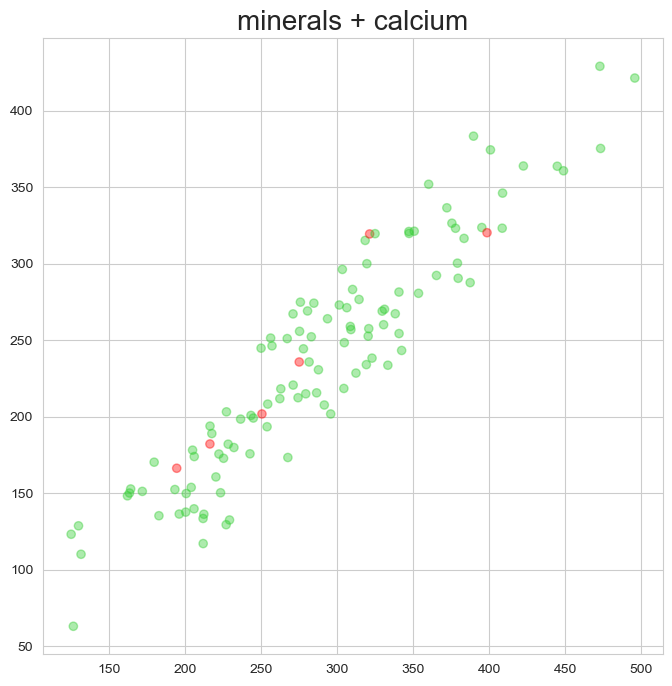

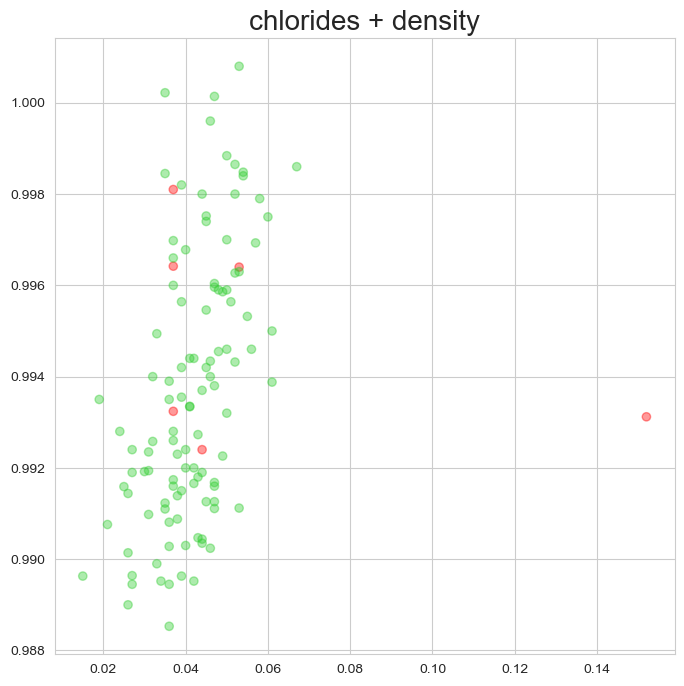

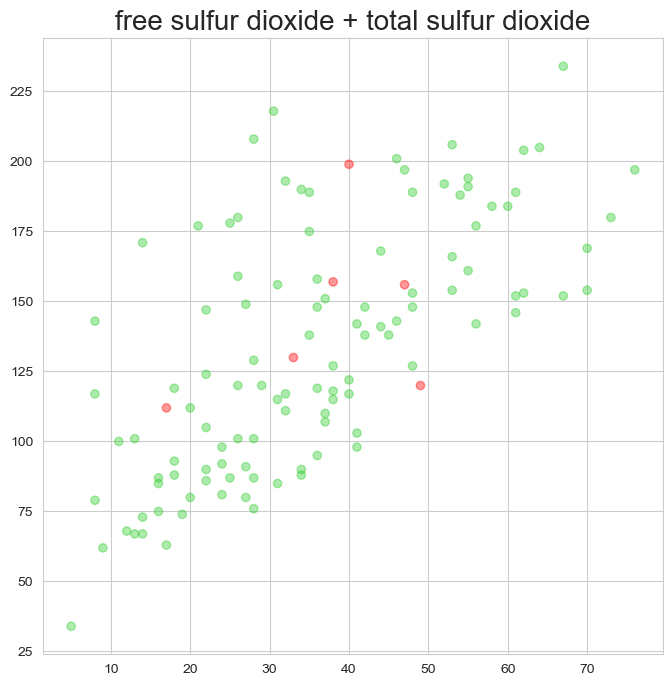

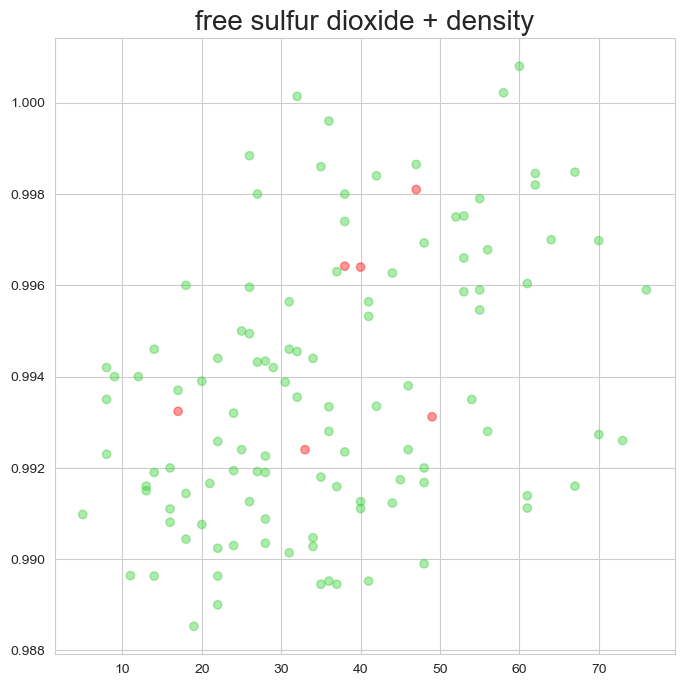

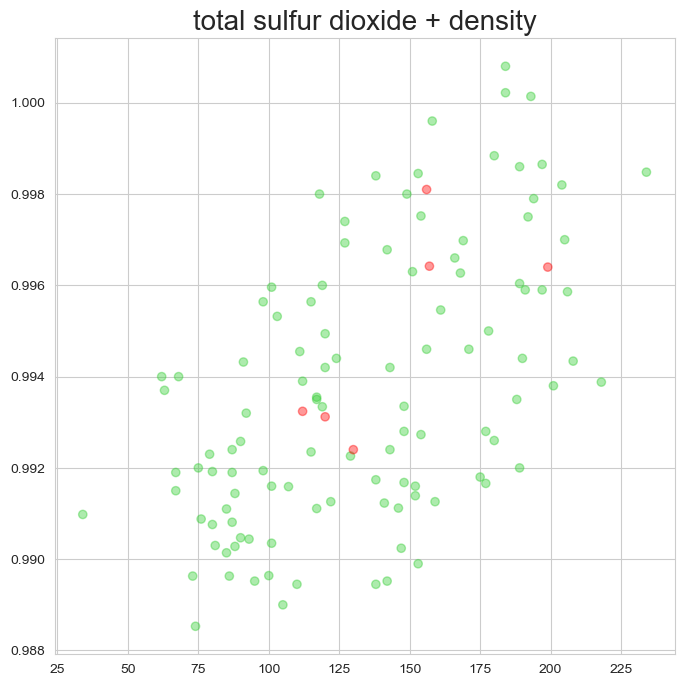

In [44]:
# prepare data frame and remove quality
df_gamay_scat_temp = df_gamay.iloc[:, 1:]
df_gamay_scat = df_gamay_scat_temp.drop(["quality"], axis=1)

# get all possible pars from highly correlated features
dict_with_pairs_gamay=get_pairs_with_high_correlation(df_gamay_scat, df_gamay_scat.columns, 0.3)

# add column 'outliers' with NaN values
df_gamay_scat = df_gamay_scat.assign(outliers=np.nan)

# add outlier indices
df_gamay_scat.loc[df_gamay_scat.index.isin(all_outlier_indices_gamay), 'outliers'] = True
df_gamay_scat['color'] = df_gamay_scat.apply(assign_color, axis=1)

if len(df_gamay_scat.loc[df_gamay_scat['outliers']==True]) > 0:
    for pair in dict_with_pairs_gamay:
        df_origin=df_gamay_scat
        x = dict_with_pairs_gamay[pair][0]
        y = dict_with_pairs_gamay[pair][1]
        data={x: df_origin[x].values, y: df_origin[y].values, 'outlier': df_origin['outliers'].values, 'color': df_origin['color'].values}
        df = pd.DataFrame(data, columns=[x, y,'outliers', 'color'])
        scatterplots_of_pairs(df, title=x.replace('_', ' ')+" + "+y.replace('_', ' '))
else:
    print("no outliers")

## Features to be transformed, standardized or normalized

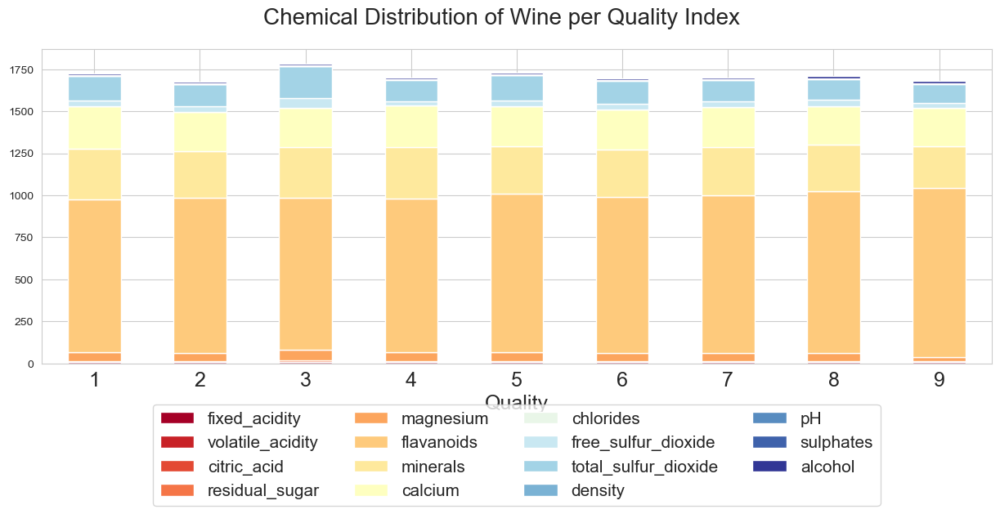

In [45]:
df_wine_clean.groupby(["quality"]).mean().plot.bar(
    stacked=True, cmap="RdYlBu", figsize=(15, 5)
)

plt.suptitle(
    "Chemical Distribution of Wine per Quality Index", fontsize=20
)
plt.xticks(size=18, rotation="horizontal")
plt.xlabel("Quality", fontsize=18)

plt.legend(loc="lower center", bbox_to_anchor=(0.5, -0.48), ncol=4, fontsize=15)

As we can see, the value of for example specific values are way bigger than for example density.
So feature scaling is very important.

### Transformation (without Gamay)

First we test Normality with the Shapiro-Wilk Test to see which features look Gaussian.

For our regression analysis in Task 2 gaussian normal distributed values work best (Source: Lecture Data Transformation, Slide 15)

Features that look Gaussian:
flavanoids
minerals
calcium

Features that not look Gaussian:
fixed_acidity
volatile_acidity
citric_acid
residual_sugar
magnesium
chlorides
free_sulfur_dioxide
total_sulfur_dioxide
density
pH
sulphates
alcohol


/var/folders/24/6blg6t315h3bmgqnq615fm400000gn/T/ipykernel_30454/3890940210.py:38: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df_wine_no_gamay[gaussian_features[0]], bins=60, kde=True, color="g").set_title("Gaussian: "+gaussian_features[0])


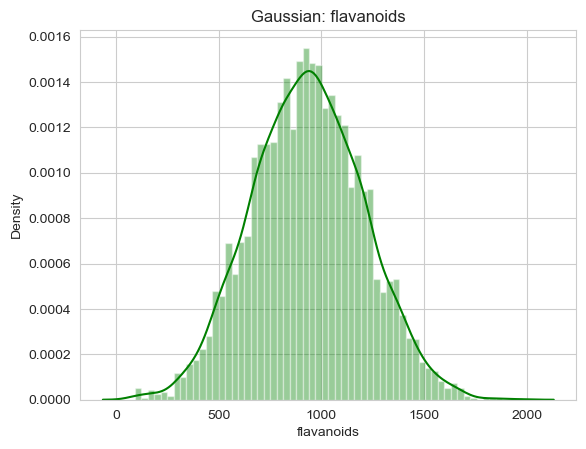

/var/folders/24/6blg6t315h3bmgqnq615fm400000gn/T/ipykernel_30454/3890940210.py:42: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df_wine_no_gamay[not_gaussian_features[0]], bins=60, kde=True, color="g").set_title("Not Gaussian: "+not_gaussian_features[0])


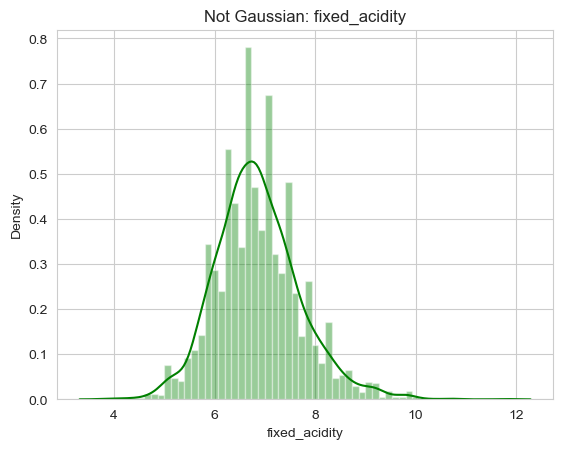

/var/folders/24/6blg6t315h3bmgqnq615fm400000gn/T/ipykernel_30454/3890940210.py:46: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df_wine_no_gamay['residual_sugar'], bins=60, kde=True, color="g").set_title("Skewed distribution: "+'residual_sugar')


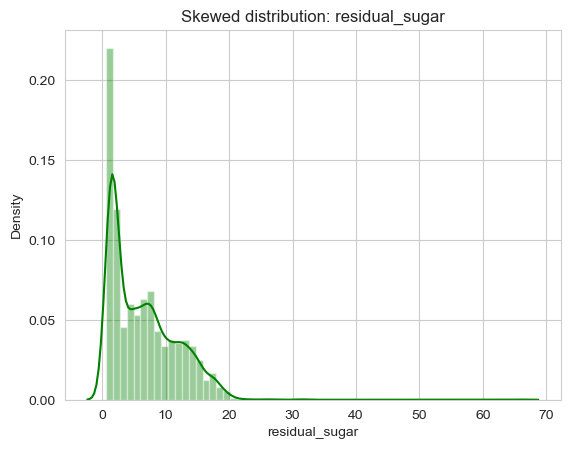

In [46]:
# Shapiro-Wilk Test
from scipy.stats import shapiro

feature_names = df_wine_no_gamay.columns
feature_names = feature_names.drop('wine_type')
feature_names = feature_names.drop('quality')

# Initalize lists for the specific features
gaussian_features = []
not_gaussian_features = []

for feature_name in feature_names:
    # normality test
    stat, p = shapiro(df_wine_no_gamay[feature_name])
    #print(feature_name + ':\n\nStatistics=%.3f, p=%.3f' % (stat, p))
    # interpret
    alpha = 0.05
    if p > alpha:
        gaussian_features.append(feature_name)
        #print('\nSample looks Gaussian (fail to reject H0)')
    else:
        not_gaussian_features.append(feature_name)

    #print('Sample does not look Gaussian (reject H0)')
    #print("\n__________\n")

# Print the Gaussian Features
print("Features that look Gaussian:")
for i in gaussian_features:
    print(i)

# Print the features that not look Gaussian
print("\nFeatures that not look Gaussian:")
for i in not_gaussian_features:
    print(i)

# Example for Gaussian Feature
sns.distplot(df_wine_no_gamay[gaussian_features[0]], bins=60, kde=True, color="g").set_title("Gaussian: "+gaussian_features[0])
plt.show()

# Example for not Gaussian Feature
sns.distplot(df_wine_no_gamay[not_gaussian_features[0]], bins=60, kde=True, color="g").set_title("Not Gaussian: "+not_gaussian_features[0])
plt.show()

# Example for Skewed Distribution
sns.distplot(df_wine_no_gamay['residual_sugar'], bins=60, kde=True, color="g").set_title("Skewed distribution: "+'residual_sugar')
plt.show()

According to the Shapiro-Wilk Test following features do not look Gaussian and need to be transformed to gaussian normal distribution:
- fixed acidity
- volatile acidity
- citric acid
- residual sugar
- magnesium
- chlorides
- free sulfur dioxide
- total sulfur dioxide
- density
- pH
- sulphates
- alcohol

Regardless of the cause, a p-value of 0 indicates that the data is very far from being normally distributed, and you should not assume that it is. Instead, you should consider alternative approaches for analyzing the data, such as using non-parametric tests or transforming the data to better fit a normal distribution.

(In our outlier analysis you can see the distributions in histograms for each features.)

For task 2 we are considering removing or fixing the outliers first and then do the Shapiro Wilk Test again to see, if the specific feature looks Gaussian now.
If not, we have to transform the feature to be gaussian normal distributed. For regression analysis gaussian normal distributed values work best (Source: Slide 15, Lecture Data Transformation)

### Normalization / Standardization (without Gamay)

First we want to boxplot each feature to see if the data have varying scales.

<AxesSubplot:>

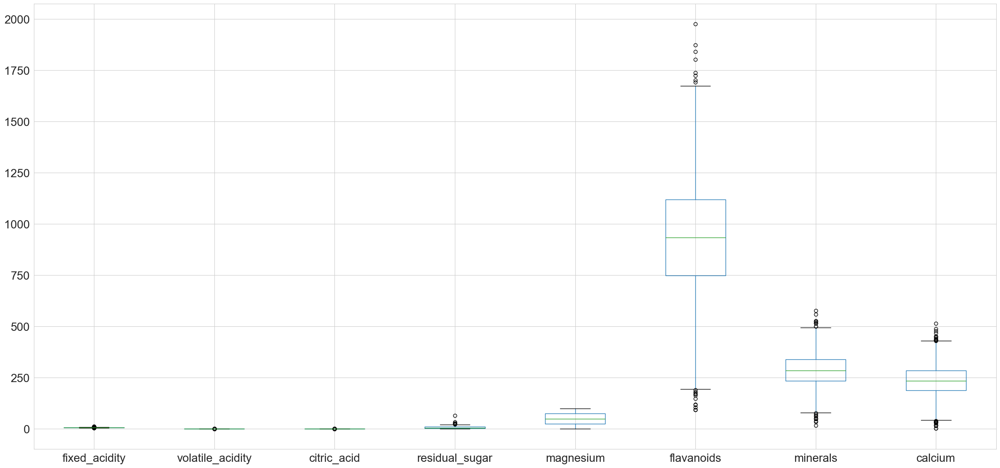

In [47]:
# boxplots first features
df_boxplots=df_wine_no_gamay.iloc[:,1:-8]
df_boxplots.boxplot(figsize=[30,14], fontsize=20)

<AxesSubplot:>

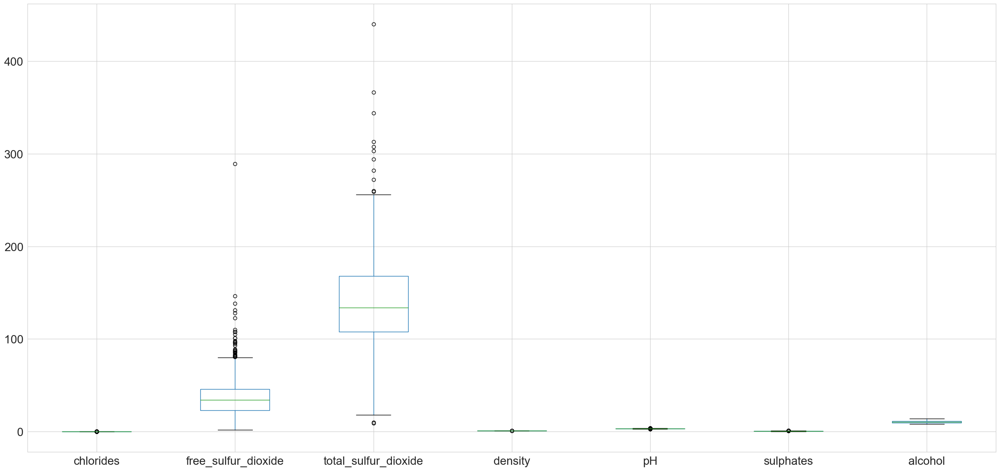

In [48]:
# boxplots rest of the features
df_boxplots=df_wine_no_gamay.iloc[:,-8:-1]
df_boxplots.boxplot(figsize=[30,14], fontsize=20)

As we can see the ranges of the features are extremely varying, especially the following features:
- flavanoids
- minerals
- calcium
- free sulfur dioxide
- total sulfur dioxide

We do not use the Robust Scaler even though it provides us with the best results. It doesn't help us securing a better accuracy.

Therefore in task 2, we consider using Standardization with the StandardScaler because it is useful when "the subsequent data assumes a Gaussian Distribution" (Source: Lakshmanan 2019, Lecture Feature Scaling Slide 13). During the Data Transformation process all features should be Gaussian distributed so the StandardScaler works better.
In addition, the outliers should already be handled in Task 2 so we expect to have no outlier effects.

Of course, we will also try out the MinMaxScaler in Task 2 if our model does not perform.

### Transformation (without Gamay)

First we test Normality with the Shapiro-Wilk Test to see which features look Gaussian.

For our regression analysis in Task 2 gaussian normal distributed values work best (Source: Lecture Data Transformation, Slide 15)

Features that look Gaussian:
fixed_acidity
flavanoids
minerals
calcium

Features that not look Gaussian:
volatile_acidity
citric_acid
residual_sugar
magnesium
chlorides
free_sulfur_dioxide
total_sulfur_dioxide
density
pH
sulphates
alcohol


/var/folders/24/6blg6t315h3bmgqnq615fm400000gn/T/ipykernel_30454/2609466276.py:37: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df_gamay[gaussian_features[0]], bins=60, kde=True, color="g").set_title("Gaussian: "+gaussian_features[0])


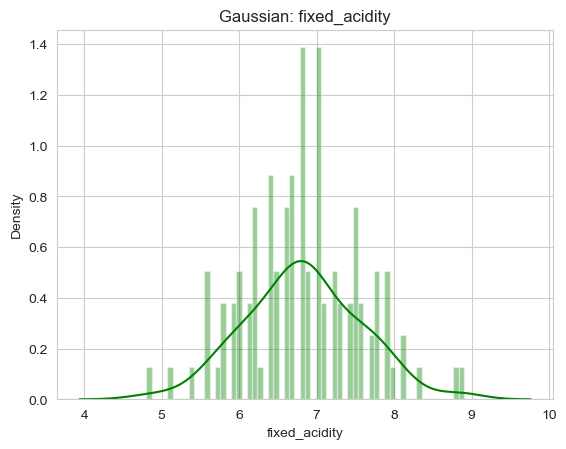

/var/folders/24/6blg6t315h3bmgqnq615fm400000gn/T/ipykernel_30454/2609466276.py:41: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df_gamay[not_gaussian_features[0]], bins=60, kde=True, color="g").set_title("Not Gaussian: "+not_gaussian_features[0])


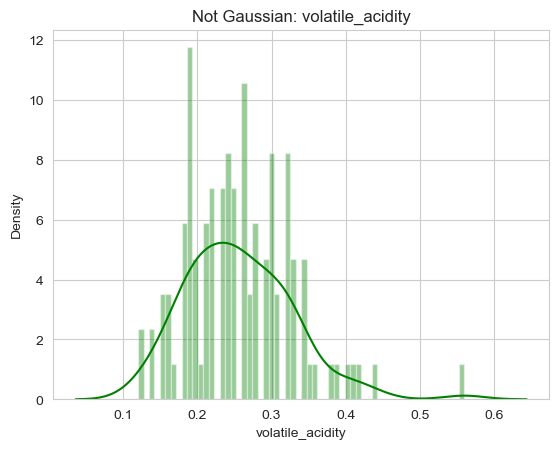

/var/folders/24/6blg6t315h3bmgqnq615fm400000gn/T/ipykernel_30454/2609466276.py:45: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df_gamay['residual_sugar'], bins=60, kde=True, color="g").set_title("Skewed distribution: "+'residual_sugar')


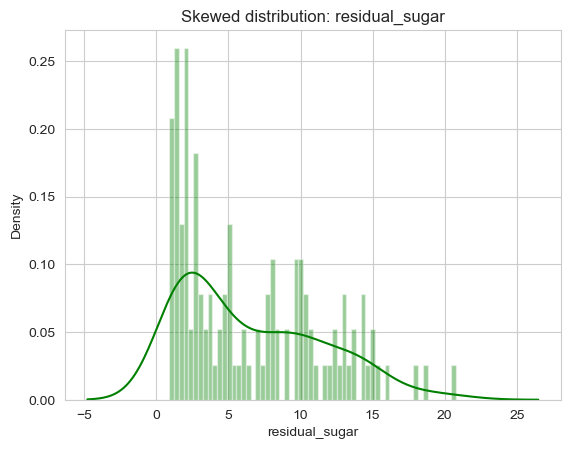

In [49]:
# Shapiro-Wilk Test

feature_names = df_gamay.columns
feature_names = feature_names.drop('wine_type')
feature_names = feature_names.drop('quality')

# Initalize lists for the specific features
gaussian_features = []
not_gaussian_features = []

for feature_name in feature_names:
    # normality test
    stat, p = shapiro(df_gamay[feature_name])
    #print(feature_name + ':\n\nStatistics=%.3f, p=%.3f' % (stat, p))
    # interpret
    alpha = 0.05
    if p > alpha:
        gaussian_features.append(feature_name)
        #print('\nSample looks Gaussian (fail to reject H0)')
    else:
        not_gaussian_features.append(feature_name)

    #print('Sample does not look Gaussian (reject H0)')
    #print("\n__________\n")

# Print the Gaussian Features
print("Features that look Gaussian:")
for i in gaussian_features:
    print(i)

# Print the features that not look Gaussian
print("\nFeatures that not look Gaussian:")
for i in not_gaussian_features:
    print(i)

# Example for Gaussian Feature
sns.distplot(df_gamay[gaussian_features[0]], bins=60, kde=True, color="g").set_title("Gaussian: "+gaussian_features[0])
plt.show()

# Example for not Gaussian Feature
sns.distplot(df_gamay[not_gaussian_features[0]], bins=60, kde=True, color="g").set_title("Not Gaussian: "+not_gaussian_features[0])
plt.show()

# Example for Skewed Distribution
sns.distplot(df_gamay['residual_sugar'], bins=60, kde=True, color="g").set_title("Skewed distribution: "+'residual_sugar')
plt.show()

Similar conclusion like before: we have to transform the feature to be gaussian normal distributed.
Only 'fixed acidity' is Gaussian for Gamay

### Normalization / Standardization (without Gamay)

First we want to boxplot each feature to see if the data have varying scales.

<AxesSubplot:>

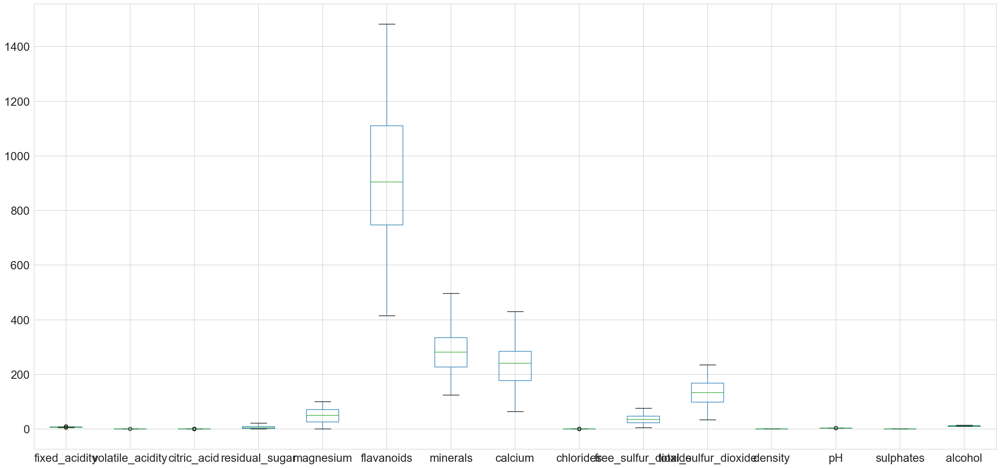

In [50]:
# boxplots first features
df_boxplots=df_gamay.iloc[:,1:-1]
df_boxplots.boxplot(figsize=[30,14], fontsize=20)

Similar conclusion for the wine type Gamay.
As we can see the ranges of the features are extremely varying, again the following features:
- flavanoids
- minerals
- calcium
- free sulfur dioxide
- total sulfur dioxide

Therefore in task 2, we again consider using Standardization with the StandardScaler because it is useful when "the subsequent data assumes a Gaussian Distribution" (Source: Lakshmanan 2019, Lecture Feature Scaling Slide 13). During the Data Transformation process all features should be Gaussian distributed so the StandardScaler works better.

## Feature Selection

An important method for us is to look at the correlation matrix of the dataset. We try to avoid high correlations like minerals and calcium. It also seems that the 4 features like magnesium, flavonoids, minerals and calcium have nearly to no correlation with most of the features and our label quality - this means that for us they might be features we’re willing to drop.

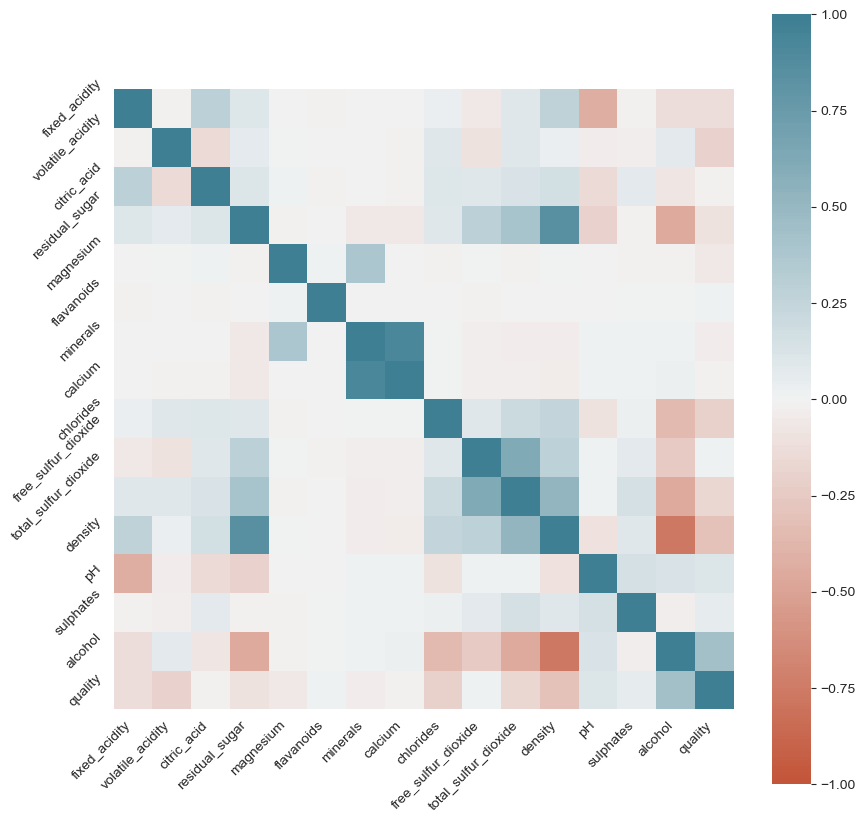

In [51]:
# pearson matrix
plt.figure(figsize=(10,10))
corr = df_wine_no_gamay.corr()
ax = sns.heatmap(
    corr,
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True, annot=False
)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
)
ax.set_yticklabels(
    ax.get_yticklabels(),
    rotation=45,

);

We are using the Pearson Correlation for our data.  Since we looked at the Pairplot earlier and our data seems to correlate some times , the Pearson Correlation might be effective as well for our linear correlation. There are correlations between density and alcohol or residual sugar and density which are strong and other minor ones. Like we said earlier we would emphasize to delete one of the features of calcium/minerals or density/alcohol, but we will look at a random forest qualifier first.

To check our data first, we use a KNN to see the result of the classifier for further use.

In [52]:
le = preprocessing.LabelEncoder()

df_wine_no_gamay['wine_type'] = le.fit_transform(df_wine_no_gamay.wine_type.values)
df_wine_no_gamay['wine_type']

Z = df_wine_no_gamay.drop('quality', axis=1)
w = df_wine_no_gamay['quality']
Z_train, z_test, w_train, w_test = train_test_split(Z, w, stratify=w)

from sklearn.neighbors import KNeighborsClassifier
from sklearn import metrics
np.random.seed(64) # initialize a random seed, this will help us make the random stuff reproducible.

model = KNeighborsClassifier()
model.fit(Z_train, w_train)
pred = model.predict(z_test)
print('score on training set:', model.score(Z_train, w_train))
print('score on test set:', model.score(z_test, w_test))
print(metrics.classification_report(y_true=w_test, y_pred=pred))

score on training set: 0.5757891085674645
score on test set: 0.38253638253638256
              precision    recall  f1-score   support

           3       0.00      0.00      0.00         3
           4       0.00      0.00      0.00        33
           5       0.34      0.40      0.37       289
           6       0.45      0.54      0.49       435
           7       0.19      0.09      0.12       167
           8       0.00      0.00      0.00        34
           9       0.00      0.00      0.00         1

    accuracy                           0.38       962
   macro avg       0.14      0.15      0.14       962
weighted avg       0.34      0.38      0.35       962



/Users/philippbauer/opt/anaconda3/envs/nlp/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/philippbauer/opt/anaconda3/envs/nlp/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/philippbauer/opt/anaconda3/envs/nlp/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modif

Since the quality of the result seems to be really bad, we might refrain from using distance classifier for our data.

To rank our features we decided to use a Random Forest classifier to show the importances of our features. It helps us in ranking the different features and allows us to select the ones helping our future regression analysis the most. In the following steps we fit our train data to the random forest classifier and afterwards print out the importance scores and visualize them later with a bar graph. Since its an ensemble method of multiple decision trees it allows us to improve our Accuracy and performance.

We see, that there are approximately 10 features we might want to use. We’ll use the Select from Model feature to use the threshold of our random forest classifier and see if the result has improved our data.

In [53]:
#use one hot encoding

le = preprocessing.LabelEncoder()

df_wine_no_gamay['wine_type'] = le.fit_transform(df_wine_no_gamay.wine_type.values)
df_wine_no_gamay['wine_type']

# create new feature good quality for wine being at and above quality 7

df_wine_no_gamay['goodquality'] = [1 if x >= 7 else 0 for x in df_wine_no_gamay['quality']]

X = df_wine_no_gamay.drop(['quality','goodquality'], axis = 1)
y = df_wine_no_gamay['goodquality']

# use standardscaler to transform features

X_features = X
X = StandardScaler().fit_transform(X)

# split dataset into test and training

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.25, random_state=0)

#print out shapes
print('Training Features Shape:', X_train.shape)
print('Training Labels Shape:', X_test.shape)
print('Testing Features Shape:', y_train.shape)
print('Testing Labels Shape:', y_test.shape)


# use random forest classifier and print out classification report and accuracy score
model = RandomForestClassifier(random_state = 1)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
print(classification_report(y_test, y_pred))
print('Accuracy Score: {}'.format(round(accuracy_score(y_test, y_pred),4)))

Training Features Shape: (2883, 16)
Training Labels Shape: (962, 16)
Testing Features Shape: (2883,)
Testing Labels Shape: (962,)
              precision    recall  f1-score   support

           0       0.88      0.96      0.91       761
           1       0.75      0.49      0.59       201

    accuracy                           0.86       962
   macro avg       0.81      0.72      0.75       962
weighted avg       0.85      0.86      0.85       962

Accuracy Score: 0.8586


<BarContainer object of 10 artists>

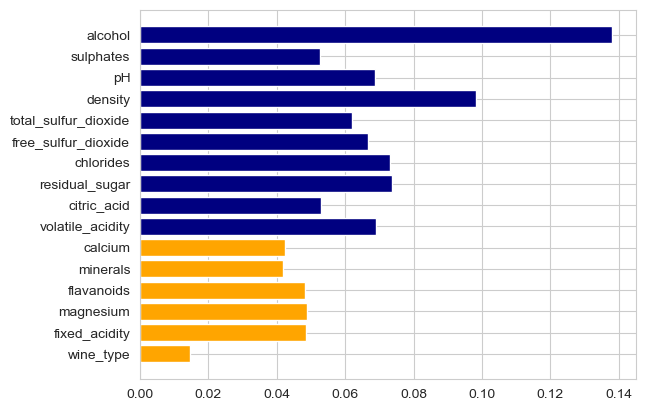

In [54]:
feat_importances = pd.Series(model.feature_importances_, index=X_features.columns)
#feat_importances.nlargest(25).plot(kind='barh',figsize=(10,10));
feat_importances = pd.DataFrame(feat_importances)
t1 = feat_importances[feat_importances[0]<0.05]
t2 = feat_importances[feat_importances[0]>=0.05]
plt.barh(t1.index.values, t1[0], color='orange')
plt.barh(t2.index.values, t2[0], color='navy')

In [55]:
np.random.seed(64) # initialize a random seed, this will help us make the random stuff reproducible.

model = Pipeline(
    [
        ('select', SelectFromModel(RandomForestClassifier(n_estimators=1000), threshold=0.05)),
        ('scaler', StandardScaler()),
        ('knn', KNeighborsClassifier(n_neighbors=1))
    ]
)

model.fit(X_train, y_train)
pred = model.predict(X_test)
print('score on training set:', model.score(X_train, y_train))
print('score on test set:', model.score(X_test, y_test))
print(metrics.classification_report(y_true=y_test, y_pred=pred))

score on training set: 1.0
score on test set: 0.8024948024948025
              precision    recall  f1-score   support

           0       0.89      0.86      0.87       761
           1       0.52      0.59      0.55       201

    accuracy                           0.80       962
   macro avg       0.71      0.72      0.71       962
weighted avg       0.81      0.80      0.81       962



As we can see from the data, we might conclude further one with those 10 features, while improvements later on might still be possible and should be considered by using different methods.

## Instance Selection

Possible instances wine data set are:

- Wine data set of all wines except for gamay
- Gamay dataset
- Possible white wine dataset, considering if there are differences between the two
- Each cluster could be a wine type: regarding the size of the dataset a difficult decision
- Training, test and validation set -> considering we are getting a data set by the professor and we already have a small sample which gets reduced even further by cluster sampling we will resort the training and test split

BUT: Since we are trying to avoid an imbalanced problem while looking at the data, there might be a need to sample the data for each variety of wine or see how we can regulate it best

In [56]:
# concering the white wine dataset vs red wine dataset, let's look at the numbers
df_wine_white = df_wine_clean.loc[(df_wine_clean["wine_type"] == "Chardonnay")]
df_wine_white.count()

wine_type               968
fixed_acidity           968
volatile_acidity        968
citric_acid             968
residual_sugar          968
magnesium               968
flavanoids              968
minerals                968
calcium                 968
chlorides               968
free_sulfur_dioxide     968
total_sulfur_dioxide    968
density                 968
pH                      968
sulphates               968
alcohol                 968
quality                 968
dtype: int64

In [57]:
df_wine_red = df_wine_clean.loc[(df_wine_clean["wine_type"] == 'Merlot') | (df_wine_clean["wine_type"] == 'Cabernet Sauvignon') | (df_wine_clean["wine_type"] == 'Pinot noir')]
df_wine_red

,wine_type,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,magnesium,flavanoids,minerals,calcium,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality
0,Pinot noir,5.8,0.15,0.49,1.1,76.729301,894.94,186.639301,109.91,0.048,21.0,98.0,0.99290,3.19,0.48,9.2,5
1,Merlot,6.6,0.25,0.32,5.6,4.795712,1160.95,251.875712,247.08,0.039,15.0,68.0,0.99163,2.96,0.52,11.1,6
3,Merlot,8.3,0.28,0.27,17.5,11.976525,777.86,237.586525,225.61,0.045,48.0,253.0,1.00014,3.02,0.56,9.1,6
4,Merlot,7.5,0.42,0.19,6.9,5.599673,785.72,95.399673,89.80,0.041,62.0,150.0,0.99508,3.23,0.37,10.0,6
5,Merlot,7.3,0.34,0.30,1.3,22.403749,1044.95,289.523749,267.12,0.057,25.0,173.0,0.99480,3.26,0.51,9.1,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3994,Pinot noir,5.7,0.20,0.30,2.5,78.038044,1046.34,207.598044,129.56,0.046,38.0,125.0,0.99276,3.34,0.50,9.9,6
3995,Cabernet Sauvignon,6.4,0.23,0.37,7.9,92.701914,1143.32,318.791914,226.09,0.050,60.0,150.0,0.99488,2.86,0.49,9.3,6
3996,Cabernet Sauvignon,7.0,0.22,0.26,9.2,94.807955,863.32,322.107955,227.30,0.027,37.0,122.0,0.99228,3.06,0.34,12.5,8
3997,Merlot,7.5,0.26,0.30,4.6,50.112474,831.67,360.872474,310.76,0.027,29.0,92.0,0.99085,3.15,0.38,12.0,7


Considering the file size, a possible white and red wine sampling would be possible.

Another decision is random sampling vs balanced sampling:

We will distinguish the data between certain quality indexes and sort create 3 quantiles and afterwards split each of them into 80/20 training and test datasets

We consider a possible cross validation as well